In [ ]:
!pip install tensorflow==2.9.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.7/511.7 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 29.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.7/438.7 kB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 12.5 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 24.3.25
    Uninstalling flatbuffers-24.3.25:
      Successfully uninstalled flatbuffers-24.3.25
  Attempting uninstall: tensorboard-data-serve

In [ ]:
import tensorflow as tf
print(tf.__version__)

2.9.0


In [ ]:
import pandas as pd

import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

from tensorflow import keras
from keras.models import Sequential, save_model
from keras.layers import LSTM, Dense, Dropout, RepeatVector, TimeDistributed

In [ ]:
ddf = pd.read_excel("hdd_dataset_5_day.xlsx")

In [ ]:
ddf.shape

(23300, 32)

In [ ]:
ddf.columns[6:-1]

Index(['failure', 'smart_1_raw', 'smart_3_raw', 'smart_4_raw', 'smart_5_raw',
       'smart_7_raw', 'smart_9_raw', 'smart_10_raw', 'smart_12_raw',
       'smart_183_raw', 'smart_184_raw', 'smart_187_raw', 'smart_188_raw',
       'smart_189_raw', 'smart_190_raw', 'smart_191_raw', 'smart_192_raw',
       'smart_193_raw', 'smart_194_raw', 'smart_197_raw', 'smart_198_raw',
       'smart_199_raw', 'smart_240_raw', 'smart_241_raw', 'smart_242_raw'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler((0, 255))

print(ddf[ddf.isnull().any(axis=1)])

cols = ddf.columns[6:-1]

number_of_rows = ddf.shape[0]
time_steps = 5
batch_size = 30
number_of_columns = len(cols)
X = ddf[cols].to_numpy()
Y = ddf[['rul']].to_numpy()

print(X.shape)
print(Y.shape)

X_svr = X.copy()
Y_svr = Y.copy()

# transform data
X = scaler.fit_transform(X)

X = X.reshape((int(number_of_rows/time_steps), time_steps, number_of_columns))
Y = Y.reshape((int(Y.shape[0]/time_steps), time_steps, 1))
# Y = Y[:, -1, :].reshape(-1, 1, 1)

print(Y.shape)

SEED = 50
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.1, random_state=SEED, shuffle=False)
# X_test, X_val, Y_test, Y_val = train_test_split(X_rem, Y_rem, test_size=0.5)

Empty DataFrame
Columns: [Unnamed: 0, index, date, serial_number, model, capacity_bytes, failure, smart_1_raw, smart_3_raw, smart_4_raw, smart_5_raw, smart_7_raw, smart_9_raw, smart_10_raw, smart_12_raw, smart_183_raw, smart_184_raw, smart_187_raw, smart_188_raw, smart_189_raw, smart_190_raw, smart_191_raw, smart_192_raw, smart_193_raw, smart_194_raw, smart_197_raw, smart_198_raw, smart_199_raw, smart_240_raw, smart_241_raw, smart_242_raw, rul]
Index: []

[0 rows x 32 columns]
(23300, 25)
(23300, 1)
(4660, 5, 1)


In [ ]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(4194, 5, 25)
(466, 5, 25)
(4194, 5, 1)
(466, 5, 1)


In [ ]:
import tensorflow as tf
import keras
from keras.models import load_model
saved_model = load_model('10_fold_model.34-0.00.h5', compile=False)

In [ ]:
saved_model.compile(optimizer='adam', loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

In [ ]:
def bim_attack(model, epsilon, data, label, alpha):
  import numpy as np
  import tensorflow as tf
  data = tf.convert_to_tensor(data)
  i = 1
  I = min(4 + epsilon/alpha, 1.25 * epsilon/alpha)
  # I = 20
  print(I)
  # epsilon_scaled = np.full((data.shape[0], data.shape[1], data.shape[2]), epsilon)
  # epsilon_scaled = tf.convert_to_tensor(epsilon_scaled)
  # print(epsilon_scaled.shape)
  while(i<=I):
    with tf.GradientTape() as tape:
      tape.watch(data)
      predictions = model(data)
      print("Predictions", predictions)
      loss = tf.keras.losses.MSE(label, predictions)
    gradient = tape.gradient(loss, data)
    print(gradient.shape)
    advX = data + (alpha * np.sign(gradient))
    advX = tf.math.minimum(data + epsilon, tf.math.maximum(data - epsilon, advX))
    data = advX
    # advX = np.where(advX > data+epsilon, data+epsilon, advX)
    # advX = np.where(advX < data-epsilon, data-epsilon, advX)
    i+=1
  return advX

#### Epsilon = 0.05

In [ ]:
# X_test = tf.convert_to_tensor(X_test)
# print(X_test.shape)
# with tf.GradientTape() as tape:
#     tape.watch(X_test)
#     predictions = saved_model(X_test)
#     print("Predictions", predictions)
#     print(predictions.shape)
#     loss = tf.keras.losses.MSE(Y_test, predictions)
#     print(loss.shape)
# gradient = tape.gradient(loss, X_test)
# print(gradient.shape)

In [ ]:
# np.sign(gradient)

In [ ]:
# adv_X = X_test - 2 * np.sign(gradient)

In [ ]:
# X_test

In [ ]:
# adv_X

In [ ]:
# adv_y.shape

In [ ]:
# Y_test.shape

In [ ]:
# pred_y = saved_model.predict(X_test)

In [ ]:
# pred_y.shape

In [ ]:
def rmse(predictions, targets):
    # Compute squared differences
    squared_diff = (predictions - targets) ** 2
    print(squared_diff.shape)
    # Calculate mean of squared differences
    mean_squared_diff = np.mean(squared_diff)
    # Take the square root to get RMSE
    rmse_value = np.sqrt(mean_squared_diff)
    return rmse_value

# Epsilon = 0.05

In [ ]:
advX_1 = bim_attack(saved_model, 0.05, X_test, Y_test, 0.01)
advX_1

6.25
Predictions tf.Tensor(
[[[ 4.0300207e+00]
  [ 2.9170642e+00]
  [ 1.9240937e+00]
  [ 9.5995373e-01]
  [-4.7938466e-02]]

 [[ 3.9864929e+00]
  [ 2.8914790e+00]
  [ 1.9157407e+00]
  [ 9.5321381e-01]
  [-3.3294201e-02]]

 [[ 3.9954343e+00]
  [ 2.8970428e+00]
  [ 1.9195065e+00]
  [ 9.5010221e-01]
  [-3.3604145e-02]]

 ...

 [[ 3.9928508e+00]
  [ 2.9012804e+00]
  [ 1.9222896e+00]
  [ 9.5273465e-01]
  [-3.4216762e-02]]

 [[ 3.9859636e+00]
  [ 2.8878596e+00]
  [ 1.8970134e+00]
  [ 9.5541191e-01]
  [-3.4973621e-03]]

 [[ 3.9714737e+00]
  [ 2.8828516e+00]
  [ 1.8955681e+00]
  [ 9.4701022e-01]
  [-2.8835773e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 4.0297637e+00]
  [ 2.9168744e+00]
  [ 1.9239947e+00]
  [ 9.5998305e-01]
  [-4.7789931e-02]]

 [[ 3.9860544e+00]
  [ 2.8912194e+00]
  [ 1.9156349e+00]
  [ 9.5321572e-01]
  [-3.3091784e-02]]

 [[ 3.9950469e+00]
  [ 2.8967946e+00]
  [ 1.9194026e+00]
  [ 9.5008492e-01]
  [-3.3454299e-02]]

 ...

 [[ 3.9924111e+0

<tf.Tensor: shape=(466, 5, 25), dtype=float64, numpy=
array([[[ 6.00000000e-02,  1.03346493e+02, -6.00000000e-02, ...,
          6.00000462e-02,  1.88607920e+02,  5.50111032e+01],
        [ 6.00000000e-02,  1.72470179e+02, -6.00000000e-02, ...,
         -5.99999537e-02,  1.88675598e+02,  5.50485817e+01],
        [ 6.00000000e-02,  2.44525151e+02, -6.00000000e-02, ...,
         -5.99999537e-02,  1.88721688e+02,  5.49475408e+01],
        [ 6.00000000e-02,  1.87725377e+02, -6.00000000e-02, ...,
         -5.99999537e-02,  1.88619152e+02,  5.50770156e+01],
        [ 2.54940000e+02,  2.08945044e+01,  6.00000000e-02, ...,
         -5.99999537e-02,  1.88786643e+02,  5.49716575e+01]],

       [[ 6.00000000e-02,  1.93946771e+02, -6.00000000e-02, ...,
          6.00000489e-02,  2.13727920e+02,  6.53965207e+01],
        [ 6.00000000e-02,  2.26316119e+01, -6.00000000e-02, ...,
         -5.99999511e-02,  2.13763075e+02,  6.54363989e+01],
        [ 6.00000000e-02,  1.77531240e+02, -6.00000000e-02, ..

In [ ]:
saved_model.evaluate(advX_1, Y_test)

15/15 [==============================] - 1s 7ms/step - loss: 0.0052 - root_mean_squared_error: 0.0723


[0.005226996261626482, 0.07229797542095184]

In [ ]:
test_pred_y_1 = saved_model.predict(advX_1)

15/15 [==============================] - 1s 5ms/step


In [ ]:
rmse_1 = rmse(Y_test, test_pred_y_1)
print(rmse_1)

(466, 5, 1)
0.072297971611589


In [ ]:
attack_rmse = []
attack_rmse.append(rmse_1)

In [ ]:
test_pred_y_1.shape

(466, 5, 1)

In [ ]:
Y_test.shape

(466, 5, 1)

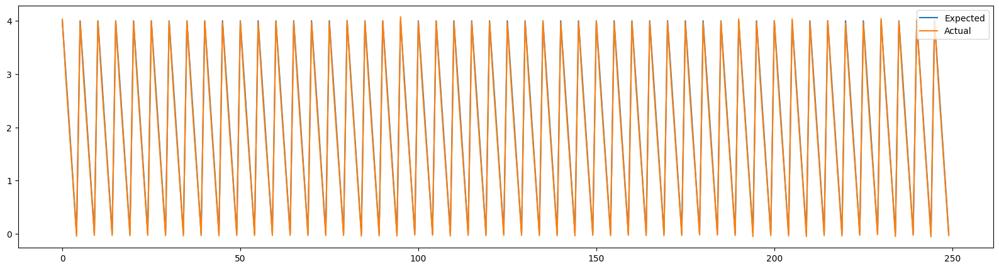

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(test_pred_y_1[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

# Epsilon = 0.1

In [ ]:
advX_2 = bim_attack(saved_model, 0.1, X_test, Y_test, 0.01)
advX_2

12.5
Predictions tf.Tensor(
[[[ 4.0300207e+00]
  [ 2.9170642e+00]
  [ 1.9240937e+00]
  [ 9.5995373e-01]
  [-4.7938466e-02]]

 [[ 3.9864929e+00]
  [ 2.8914790e+00]
  [ 1.9157407e+00]
  [ 9.5321381e-01]
  [-3.3294201e-02]]

 [[ 3.9954343e+00]
  [ 2.8970428e+00]
  [ 1.9195065e+00]
  [ 9.5010221e-01]
  [-3.3604145e-02]]

 ...

 [[ 3.9928508e+00]
  [ 2.9012804e+00]
  [ 1.9222896e+00]
  [ 9.5273465e-01]
  [-3.4216762e-02]]

 [[ 3.9859636e+00]
  [ 2.8878596e+00]
  [ 1.8970134e+00]
  [ 9.5541191e-01]
  [-3.4973621e-03]]

 [[ 3.9714737e+00]
  [ 2.8828516e+00]
  [ 1.8955681e+00]
  [ 9.4701022e-01]
  [-2.8835773e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 4.0297637e+00]
  [ 2.9168744e+00]
  [ 1.9239947e+00]
  [ 9.5998305e-01]
  [-4.7789931e-02]]

 [[ 3.9860544e+00]
  [ 2.8912194e+00]
  [ 1.9156349e+00]
  [ 9.5321572e-01]
  [-3.3091784e-02]]

 [[ 3.9950469e+00]
  [ 2.8967946e+00]
  [ 1.9194026e+00]
  [ 9.5008492e-01]
  [-3.3454299e-02]]

 ...

 [[ 3.9924111e+0

<tf.Tensor: shape=(466, 5, 25), dtype=float64, numpy=
array([[[ 1.20000000e-01,  1.03406493e+02, -1.20000000e-01, ...,
          1.20000046e-01,  1.88667920e+02,  5.50711032e+01],
        [ 1.20000000e-01,  1.72530179e+02, -1.20000000e-01, ...,
          4.62503605e-08,  1.88735598e+02,  5.51085817e+01],
        [ 1.20000000e-01,  2.44585151e+02, -1.20000000e-01, ...,
         -1.99999537e-02,  1.88781688e+02,  5.48875408e+01],
        [ 1.20000000e-01,  1.87785377e+02, -1.20000000e-01, ...,
         -1.19999954e-01,  1.88559152e+02,  5.51370156e+01],
        [ 2.54880000e+02,  2.09545044e+01,  1.20000000e-01, ...,
         -1.19999954e-01,  1.88846643e+02,  5.49116575e+01]],

       [[ 1.20000000e-01,  1.94006771e+02, -1.20000000e-01, ...,
          1.20000049e-01,  2.13787920e+02,  6.54565207e+01],
        [ 1.20000000e-01,  2.26916119e+01, -1.20000000e-01, ...,
         -1.19999951e-01,  2.13823075e+02,  6.54963989e+01],
        [ 1.20000000e-01,  1.77591240e+02, -1.20000000e-01, ..

In [ ]:
saved_model.evaluate(advX_2, Y_test)

15/15 [==============================] - 0s 8ms/step - loss: 0.0054 - root_mean_squared_error: 0.0731


[0.0053504593670368195, 0.07314683496952057]

In [ ]:
test_pred_y_2 = saved_model.predict(advX_2)

15/15 [==============================] - 0s 6ms/step


In [ ]:
rmse_2 = rmse(Y_test, test_pred_y_2)
print(rmse_2)

(466, 5, 1)
0.07314683383658409


In [ ]:
attack_rmse.append(rmse_2)

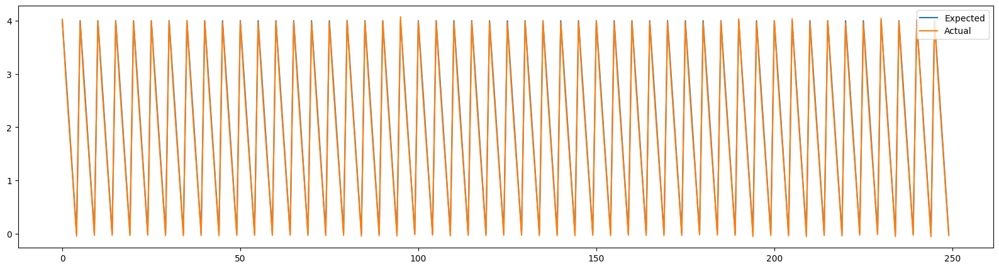

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(test_pred_y_2[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

# Epsilon = 0.15

In [ ]:
advX_3 = bim_attack(saved_model, 0.15, X_test, Y_test, 0.01)
advX_3

18.75
Predictions tf.Tensor(
[[[ 4.0300207e+00]
  [ 2.9170642e+00]
  [ 1.9240937e+00]
  [ 9.5995373e-01]
  [-4.7938466e-02]]

 [[ 3.9864929e+00]
  [ 2.8914790e+00]
  [ 1.9157407e+00]
  [ 9.5321381e-01]
  [-3.3294201e-02]]

 [[ 3.9954343e+00]
  [ 2.8970428e+00]
  [ 1.9195065e+00]
  [ 9.5010221e-01]
  [-3.3604145e-02]]

 ...

 [[ 3.9928508e+00]
  [ 2.9012804e+00]
  [ 1.9222896e+00]
  [ 9.5273465e-01]
  [-3.4216762e-02]]

 [[ 3.9859636e+00]
  [ 2.8878596e+00]
  [ 1.8970134e+00]
  [ 9.5541191e-01]
  [-3.4973621e-03]]

 [[ 3.9714737e+00]
  [ 2.8828516e+00]
  [ 1.8955681e+00]
  [ 9.4701022e-01]
  [-2.8835773e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 4.0297637e+00]
  [ 2.9168744e+00]
  [ 1.9239947e+00]
  [ 9.5998305e-01]
  [-4.7789931e-02]]

 [[ 3.9860544e+00]
  [ 2.8912194e+00]
  [ 1.9156349e+00]
  [ 9.5321572e-01]
  [-3.3091784e-02]]

 [[ 3.9950469e+00]
  [ 2.8967946e+00]
  [ 1.9194026e+00]
  [ 9.5008492e-01]
  [-3.3454299e-02]]

 ...

 [[ 3.9924111e+

<tf.Tensor: shape=(466, 5, 25), dtype=float64, numpy=
array([[[ 1.80000000e-01,  1.03466493e+02, -1.80000000e-01, ...,
          1.80000046e-01,  1.88727920e+02,  5.51311032e+01],
        [ 1.80000000e-01,  1.72590179e+02, -1.80000000e-01, ...,
          6.00000463e-02,  1.88795598e+02,  5.51685817e+01],
        [ 1.80000000e-01,  2.44645151e+02, -1.80000000e-01, ...,
          4.00000463e-02,  1.88841688e+02,  5.48275408e+01],
        [ 1.80000000e-01,  1.87845377e+02, -1.80000000e-01, ...,
         -7.99999537e-02,  1.88499152e+02,  5.51970156e+01],
        [ 2.54820000e+02,  2.10145044e+01,  1.80000000e-01, ...,
         -1.79999954e-01,  1.88786643e+02,  5.48516575e+01]],

       [[ 1.80000000e-01,  1.94066771e+02, -1.80000000e-01, ...,
          1.80000049e-01,  2.13847920e+02,  6.55165207e+01],
        [ 1.80000000e-01,  2.27516119e+01, -1.80000000e-01, ...,
         -1.79999951e-01,  2.13883075e+02,  6.55563989e+01],
        [ 1.80000000e-01,  1.77651240e+02, -1.80000000e-01, ..

In [ ]:
saved_model.evaluate(advX_3, Y_test)

15/15 [==============================] - 0s 6ms/step - loss: 0.0055 - root_mean_squared_error: 0.0740


[0.005476537626236677, 0.07400362938642502]

In [ ]:
test_pred_y_3 = saved_model.predict(advX_3)

15/15 [==============================] - 0s 5ms/step


In [ ]:
rmse_3 = rmse(Y_test, test_pred_y_3)
print(rmse_3)

(466, 5, 1)
0.0740036344001326


In [ ]:
attack_rmse.append(rmse_3)

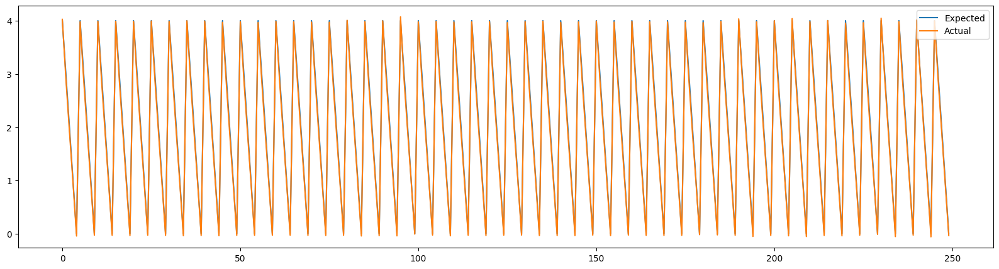

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(test_pred_y_3[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

# Epsilon = 0.2

In [ ]:
advX_4 = bim_attack(saved_model, 0.2, X_test, Y_test, 0.01)
advX_4

24.0
Predictions tf.Tensor(
[[[ 4.0300207e+00]
  [ 2.9170642e+00]
  [ 1.9240937e+00]
  [ 9.5995373e-01]
  [-4.7938466e-02]]

 [[ 3.9864929e+00]
  [ 2.8914790e+00]
  [ 1.9157407e+00]
  [ 9.5321381e-01]
  [-3.3294201e-02]]

 [[ 3.9954343e+00]
  [ 2.8970428e+00]
  [ 1.9195065e+00]
  [ 9.5010221e-01]
  [-3.3604145e-02]]

 ...

 [[ 3.9928508e+00]
  [ 2.9012804e+00]
  [ 1.9222896e+00]
  [ 9.5273465e-01]
  [-3.4216762e-02]]

 [[ 3.9859636e+00]
  [ 2.8878596e+00]
  [ 1.8970134e+00]
  [ 9.5541191e-01]
  [-3.4973621e-03]]

 [[ 3.9714737e+00]
  [ 2.8828516e+00]
  [ 1.8955681e+00]
  [ 9.4701022e-01]
  [-2.8835773e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 4.0297637e+00]
  [ 2.9168744e+00]
  [ 1.9239947e+00]
  [ 9.5998305e-01]
  [-4.7789931e-02]]

 [[ 3.9860544e+00]
  [ 2.8912194e+00]
  [ 1.9156349e+00]
  [ 9.5321572e-01]
  [-3.3091784e-02]]

 [[ 3.9950469e+00]
  [ 2.8967946e+00]
  [ 1.9194026e+00]
  [ 9.5008492e-01]
  [-3.3454299e-02]]

 ...

 [[ 3.9924111e+0

<tf.Tensor: shape=(466, 5, 25), dtype=float64, numpy=
array([[[ 2.20000000e-01,  1.03526493e+02, -2.40000000e-01, ...,
          2.40000046e-01,  1.88787920e+02,  5.51911032e+01],
        [ 2.40000000e-01,  1.72650179e+02, -2.40000000e-01, ...,
          1.20000046e-01,  1.88855598e+02,  5.52285817e+01],
        [ 2.40000000e-01,  2.44705151e+02, -2.40000000e-01, ...,
          1.00000046e-01,  1.88901688e+02,  5.47675408e+01],
        [ 2.40000000e-01,  1.87905377e+02, -2.40000000e-01, ...,
         -1.99999537e-02,  1.88439152e+02,  5.52570156e+01],
        [ 2.54760000e+02,  2.10745044e+01,  2.40000000e-01, ...,
         -2.39999954e-01,  1.88726643e+02,  5.47916575e+01]],

       [[ 2.40000000e-01,  1.94126771e+02, -2.40000000e-01, ...,
          2.40000049e-01,  2.13907920e+02,  6.55765207e+01],
        [ 2.40000000e-01,  2.28116119e+01, -2.40000000e-01, ...,
         -2.39999951e-01,  2.13943075e+02,  6.56163989e+01],
        [ 2.40000000e-01,  1.77711240e+02, -2.40000000e-01, ..

In [ ]:
saved_model.evaluate(advX_4, Y_test)

15/15 [==============================] - 0s 5ms/step - loss: 0.0056 - root_mean_squared_error: 0.0749


[0.005604719277471304, 0.07486467063426971]

In [ ]:
test_pred_y_4 = saved_model.predict(advX_4)

15/15 [==============================] - 0s 5ms/step


In [ ]:
rmse_4 = rmse(Y_test, test_pred_y_4)
print(rmse_4)

(466, 5, 1)
0.07486467250593824


In [ ]:
attack_rmse.append(rmse_4)

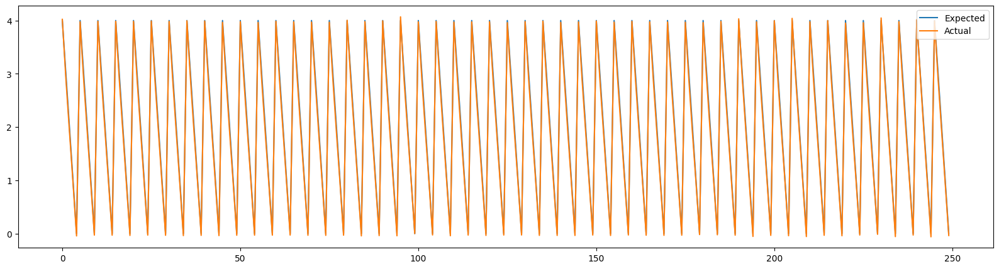

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(test_pred_y_4[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

In [ ]:
attack_rmse

[0.072297971611589,
 0.07314683383658409,
 0.0740036344001326,
 0.07486467250593824]

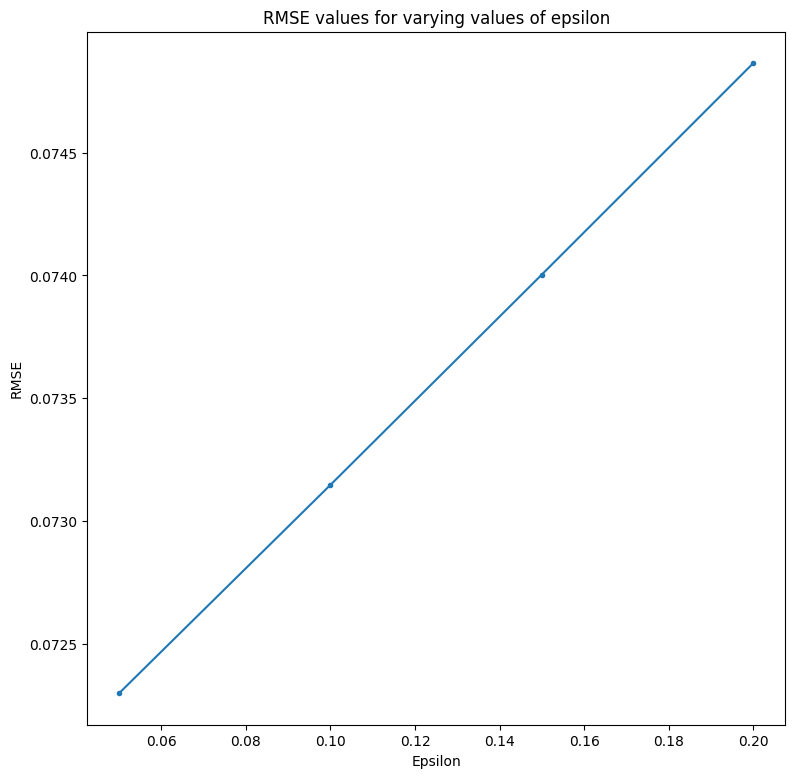

In [ ]:
epsilon_x_axis = [0.05, 0.1, 0.15, 0.2]
plt.figure(figsize=(9, 9))
plt.ylabel('RMSE')
plt.xlabel('Epsilon')
plt.title("RMSE values for varying values of epsilon")
plt.plot(epsilon_x_axis, attack_rmse, marker=".",)
plt.show()

# FGSM Attack with higher orders of perturbation magnitude since Encoder Decoder LSTM is inherently robust to lower magnitudes of epsilon

## Epsilon = 3

In [ ]:
advX_5 = bim_attack(saved_model, 3, X_test, Y_test, 0.01)
advX_5

Streaming output truncated to the last 5000 lines.
  [ 3.0373037e-02]]

 [[ 3.9210923e+00]
  [ 2.7842033e+00]
  [ 1.8413777e+00]
  [ 9.5780432e-01]
  [ 6.6612124e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 3.9549654e+00]
  [ 2.8714273e+00]
  [ 1.9053940e+00]
  [ 9.6941483e-01]
  [-1.2342215e-02]]

 [[ 3.9034493e+00]
  [ 2.8450375e+00]
  [ 1.8967354e+00]
  [ 9.5702219e-01]
  [ 5.3583384e-03]]

 [[ 3.9217753e+00]
  [ 2.8519943e+00]
  [ 1.9003832e+00]
  [ 9.4965011e-01]
  [-3.6725998e-03]]

 ...

 [[ 3.9091585e+00]
  [ 2.8510685e+00]
  [ 1.9015155e+00]
  [ 9.6126813e-01]
  [-4.8071146e-04]]

 [[ 3.8924263e+00]
  [ 2.8012540e+00]
  [ 1.8175068e+00]
  [ 9.4125944e-01]
  [ 3.0831635e-02]]

 [[ 3.9211917e+00]
  [ 2.7831607e+00]
  [ 1.8407811e+00]
  [ 9.5809072e-01]
  [ 6.7773700e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 3.9544966e+00]
  [ 2.8711596e+00]
  [ 1.9052908e+00]
  [ 9.6947056e-01]
  [-1.2128651e-02]]

 [[ 

<tf.Tensor: shape=(466, 5, 25), dtype=float64, numpy=
array([[[-1.14000000e+00,  1.02066493e+02, -3.04000000e+00, ...,
          3.04000005e+00,  1.91587920e+02,  5.79911032e+01],
        [ 3.04000000e+00,  1.71190179e+02, -3.04000000e+00, ...,
          2.92000005e+00,  1.91655598e+02,  5.80285817e+01],
        [-2.10000000e+00,  2.42405151e+02, -3.04000000e+00, ...,
          2.90000005e+00,  1.91701688e+02,  5.19675408e+01],
        [ 3.04000000e+00,  1.90705377e+02, -3.04000000e+00, ...,
          2.78000005e+00,  1.90859152e+02,  5.80570156e+01],
        [ 2.51960000e+02,  2.38745044e+01,  3.04000000e+00, ...,
         -3.03999995e+00,  1.85926643e+02,  5.19916575e+01]],

       [[-1.00000000e-01,  1.96086771e+02, -3.04000000e+00, ...,
          3.04000005e+00,  2.16707920e+02,  6.75365207e+01],
        [ 3.04000000e+00,  2.47716119e+01, -3.04000000e+00, ...,
         -2.19999995e+00,  2.15903075e+02,  6.84163989e+01],
        [ 2.20000000e+00,  1.79671240e+02, -3.04000000e+00, ..

In [ ]:
saved_model.evaluate(advX_5, Y_test)

15/15 [==============================] - 1s 5ms/step - loss: 0.0181 - root_mean_squared_error: 0.1344


[0.018061470240354538, 0.13439297676086426]

In [ ]:
test_pred_y_5 = saved_model.predict(advX_5)

15/15 [==============================] - 1s 7ms/step


In [ ]:
attack_rmse = []
rmse_5 = rmse(Y_test, test_pred_y_5)
print(rmse_5)
attack_rmse.append(rmse_5)

(466, 5, 1)
0.1343929695613114


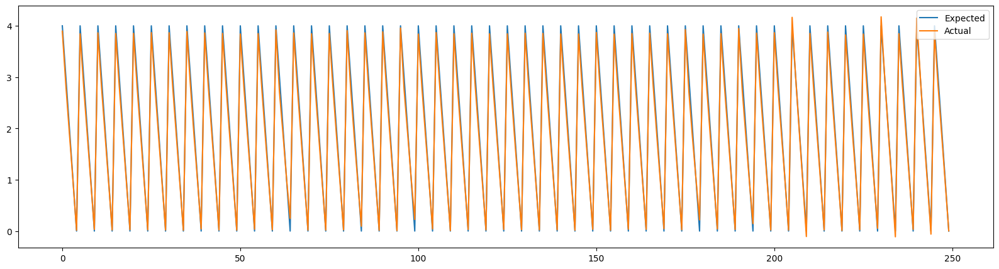

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(test_pred_y_5[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

## Epsilon = 5

In [ ]:
advX_6 = bim_attack(saved_model, 5, X_test, Y_test, 0.01)
advX_6

Streaming output truncated to the last 5000 lines.
  [0.07344401]]

 [[3.8876357 ]
  [2.6296449 ]
  [1.8363299 ]
  [1.0096278 ]
  [0.2355631 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.8594103 ]
  [2.8178458 ]
  [1.8847182 ]
  [0.9800362 ]
  [0.03151172]]

 [[3.8125885 ]
  [2.7975073 ]
  [1.8772651 ]
  [0.9651854 ]
  [0.04759157]]

 [[3.8287914 ]
  [2.7973769 ]
  [1.8734045 ]
  [0.95093936]
  [0.03782648]]

 ...

 [[3.8220503 ]
  [2.803203  ]
  [1.881112  ]
  [0.9703874 ]
  [0.04251909]]

 [[3.7572505 ]
  [2.7505157 ]
  [1.7660724 ]
  [0.94490063]
  [0.07312703]]

 [[3.887278  ]
  [2.629317  ]
  [1.8362572 ]
  [1.0096955 ]
  [0.23590428]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.8589215 ]
  [2.8175774 ]
  [1.8846133 ]
  [0.9800803 ]
  [0.03172338]]

 [[3.8121436 ]
  [2.7972782 ]
  [1.8771739 ]
  [0.96522105]
  [0.04779315]]

 [[3.82835   ]
  [2.797066  ]
  [1.8731973 ]
  [0.9508963 ]
  [0.03804189]]

 ...

 [[3.821

<tf.Tensor: shape=(466, 5, 25), dtype=float64, numpy=
array([[[-2.40000000e-01,  1.00066493e+02, -5.04000000e+00, ...,
          5.04000005e+00,  1.93587920e+02,  5.99911032e+01],
        [ 5.04000000e+00,  1.69190179e+02, -5.04000000e+00, ...,
          4.92000005e+00,  1.93655598e+02,  6.00285817e+01],
        [-4.10000000e+00,  2.40405151e+02, -5.04000000e+00, ...,
          4.90000005e+00,  1.93701688e+02,  4.99675408e+01],
        [ 5.04000000e+00,  1.92705377e+02, -5.04000000e+00, ...,
          4.78000005e+00,  1.92859152e+02,  6.00570156e+01],
        [ 2.49960000e+02,  2.58745044e+01,  5.04000000e+00, ...,
         -5.03999995e+00,  1.83926643e+02,  4.99916575e+01]],

       [[-4.80000000e-01,  1.95706771e+02, -5.04000000e+00, ...,
          5.04000005e+00,  2.18707920e+02,  6.71565207e+01],
        [ 5.04000000e+00,  2.43916119e+01, -5.04000000e+00, ...,
         -1.81999995e+00,  2.15523075e+02,  7.04163989e+01],
        [ 1.82000000e+00,  1.79291240e+02, -5.04000000e+00, ..

In [ ]:
saved_model.evaluate(advX_6, Y_test)

15/15 [==============================] - 0s 5ms/step - loss: 0.0363 - root_mean_squared_error: 0.1904


[0.03626479580998421, 0.19043318927288055]

In [ ]:
test_pred_y_6 = saved_model.predict(advX_6)

15/15 [==============================] - 0s 6ms/step


In [ ]:
rmse_6 = rmse(Y_test, test_pred_y_6)
print(rmse_6)
attack_rmse.append(rmse_6)

(466, 5, 1)
0.19043318457061217


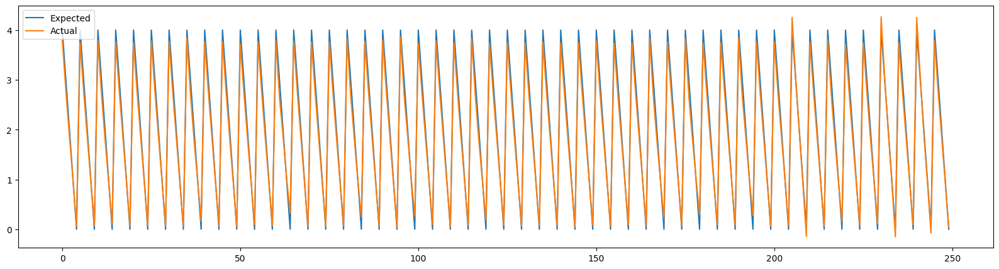

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(test_pred_y_6[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

## Epsilon = 7

In [ ]:
advX_7 = bim_attack(saved_model, 7, X_test, Y_test, 0.01)
advX_7

Streaming output truncated to the last 5000 lines.
  [0.10340816]]

 [[3.7931993 ]
  [2.5713034 ]
  [1.8106678 ]
  [1.0219705 ]
  [0.2851457 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.7575057 ]
  [2.7629466 ]
  [1.8620224 ]
  [0.98755836]
  [0.07571548]]

 [[3.721522  ]
  [2.7523005 ]
  [1.8580711 ]
  [0.97446114]
  [0.09047592]]

 [[3.7870884 ]
  [2.667934  ]
  [1.7984617 ]
  [0.97476673]
  [0.20959872]]

 ...

 [[3.7273645 ]
  [2.7279491 ]
  [1.829973  ]
  [0.9685233 ]
  [0.10776848]]

 [[3.6812935 ]
  [2.7083902 ]
  [1.7492776 ]
  [0.946126  ]
  [0.10394108]]

 [[3.792678  ]
  [2.571023  ]
  [1.8105304 ]
  [1.0220351 ]
  [0.28536522]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.7569685 ]
  [2.762652  ]
  [1.8618877 ]
  [0.98758537]
  [0.0759632 ]]

 [[3.721009  ]
  [2.752046  ]
  [1.8579645 ]
  [0.9744934 ]
  [0.09070045]]

 [[3.7869263 ]
  [2.6672144 ]
  [1.7986677 ]
  [0.97510266]
  [0.21082842]]

 ...

 [[3.726

<tf.Tensor: shape=(466, 5, 25), dtype=float64, numpy=
array([[[ -2.24      ,  98.06649323,  -7.04      , ...,   7.04000005,
         194.80792018,  61.99110317],
        [  7.04      , 167.1901787 ,  -7.04      , ...,   6.92000005,
         192.5155983 ,  62.02858168],
        [ -6.1       , 238.40515107,  -7.04      , ...,   6.90000005,
         192.02168808,  47.96754083],
        [  7.04      , 193.84537665,  -7.04      , ...,   6.78000005,
         193.95915203,  62.0570156 ],
        [247.96      ,  27.87450437,   7.04      , ...,  -7.03999995,
         183.00664255,  47.99165753]],

       [[ -0.92      , 195.26677064,  -7.04      , ...,   7.04000005,
         220.70791989,  66.71652068],
        [  7.04      ,  23.9516119 ,  -7.04      , ...,  -1.37999995,
         215.08307494,  72.41639894],
        [  1.38      , 178.85123977,  -7.04      , ...,   7.04000005,
         215.12238414,  66.80400732],
        [  7.04      , 129.8253291 ,  -7.04      , ...,   2.68000005,
         2

In [ ]:
saved_model.evaluate(advX_7, Y_test)

15/15 [==============================] - 0s 7ms/step - loss: 0.0628 - root_mean_squared_error: 0.2505


[0.06275688856840134, 0.2505132555961609]

In [ ]:
test_pred_y_7 = saved_model.predict(advX_7)

15/15 [==============================] - 0s 7ms/step


In [ ]:
rmse_7 = rmse(Y_test, test_pred_y_7)
print(rmse_7)
attack_rmse.append(rmse_7)

(466, 5, 1)
0.250513243062039


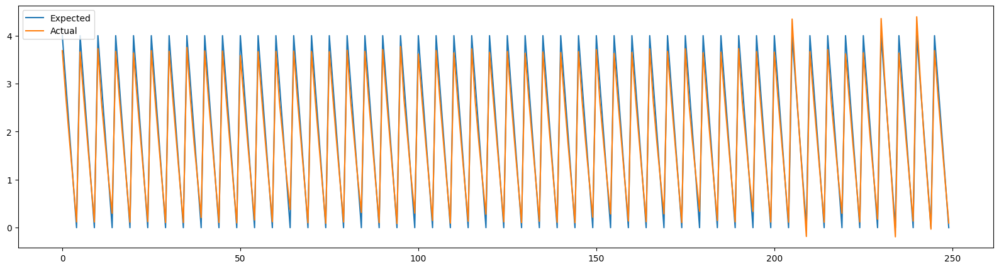

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(test_pred_y_7[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

## Epsilon = 9

In [ ]:
advX_8 = bim_attack(saved_model, 9, X_test, Y_test, 0.01)
advX_8

Streaming output truncated to the last 5000 lines.
  [0.11119431]]

 [[3.687911  ]
  [2.5188546 ]
  [1.7837813 ]
  [1.0348992 ]
  [0.32787335]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.64755   ]
  [2.6667085 ]
  [1.8004181 ]
  [0.99130714]
  [0.1859498 ]]

 [[3.6241472 ]
  [2.704696  ]
  [1.8351835 ]
  [0.98281944]
  [0.13531822]]

 [[3.6853397 ]
  [2.5897267 ]
  [1.8100808 ]
  [1.0120468 ]
  [0.3250454 ]]

 ...

 [[3.6485212 ]
  [2.5974884 ]
  [1.7964447 ]
  [1.0166407 ]
  [0.3178581 ]]

 [[3.551111  ]
  [2.6470551 ]
  [1.7429886 ]
  [0.9515297 ]
  [0.11142212]]

 [[3.6873794 ]
  [2.518534  ]
  [1.7836689 ]
  [1.0349379 ]
  [0.32805097]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.6470048 ]
  [2.6659608 ]
  [1.7999649 ]
  [0.99149096]
  [0.1871556 ]]

 [[3.623674  ]
  [2.704473  ]
  [1.835061  ]
  [0.9828706 ]
  [0.13555098]]

 [[3.6847205 ]
  [2.589418  ]
  [1.8100401 ]
  [1.0121659 ]
  [0.32537884]]

 ...

 [[3.648

<tf.Tensor: shape=(466, 5, 25), dtype=float64, numpy=
array([[[ -4.24      ,  96.06649323,  -6.18      , ...,   6.54000005,
         192.80792018,  61.27110317],
        [  6.54      , 165.1901787 ,  -6.54      , ...,   6.42000005,
         190.5155983 ,  61.12858168],
        [ -8.1       , 236.40515107,  -6.14      , ...,   6.10000005,
         190.48168808,  45.96754083],
        [  8.4       , 194.34537665,  -8.46      , ...,   6.28000005,
         192.71915203,  64.0570156 ],
        [245.96      ,  29.87450437,   9.04      , ...,  -9.03999995,
         185.00664255,  45.99165753]],

       [[ -0.7       , 194.94677064,  -7.48      , ...,   7.48000005,
         221.14791989,  66.39652068],
        [  8.26      ,  24.2316119 ,  -7.48      , ...,  -1.35999995,
         214.76307494,  72.85639894],
        [  1.2       , 178.95123977,  -7.48      , ...,   7.44000005,
         214.80238414,  66.26400732],
        [  8.2       , 130.3653291 ,  -8.74      , ...,   2.22000005,
         2

In [ ]:
saved_model.evaluate(advX_8, Y_test)

15/15 [==============================] - 0s 6ms/step - loss: 0.0945 - root_mean_squared_error: 0.3075


[0.094535693526268, 0.3074665367603302]

In [ ]:
test_pred_y_8 = saved_model.predict(advX_8)

15/15 [==============================] - 0s 6ms/step


In [ ]:
rmse_8 = rmse(Y_test, test_pred_y_8)
print(rmse_8)
attack_rmse.append(rmse_8)

(466, 5, 1)
0.3074665537459912


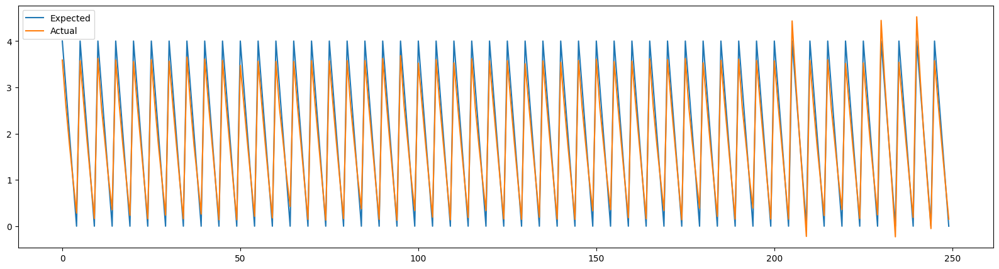

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(test_pred_y_8[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

## Epsilon = 11

In [ ]:
advX_9 = bim_attack(saved_model, 11, X_test, Y_test, 0.01)
advX_9

Streaming output truncated to the last 5000 lines.
  [0.16586679]]

 [[3.5760746 ]
  [2.468243  ]
  [1.7591562 ]
  [1.0492498 ]
  [0.37129217]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.5582922 ]
  [2.587779  ]
  [1.767134  ]
  [1.0153377 ]
  [0.30443388]]

 [[3.5432456 ]
  [2.6177924 ]
  [1.7583542 ]
  [0.9878736 ]
  [0.22429353]]

 [[3.5883605 ]
  [2.5440102 ]
  [1.7961779 ]
  [1.0283135 ]
  [0.37423253]]

 ...

 [[3.5541725 ]
  [2.544948  ]
  [1.7912297 ]
  [1.0382934 ]
  [0.38048166]]

 [[3.4308553 ]
  [2.5957546 ]
  [1.7079686 ]
  [0.95508224]
  [0.16605717]]

 [[3.5755014 ]
  [2.4679644 ]
  [1.7590568 ]
  [1.0493191 ]
  [0.3714884 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.5579228 ]
  [2.5875568 ]
  [1.7670896 ]
  [1.0153993 ]
  [0.30467725]]

 [[3.5428374 ]
  [2.617104  ]
  [1.7577419 ]
  [0.9880556 ]
  [0.22530735]]

 [[3.5879395 ]
  [2.5437553 ]
  [1.7960694 ]
  [1.0283473 ]
  [0.37444282]]

 ...

 [[3.553

<tf.Tensor: shape=(466, 5, 25), dtype=float64, numpy=
array([[[-5.42000000e+00,  9.59064932e+01, -4.92000000e+00, ...,
          5.18000005e+00,  1.92387920e+02,  6.02711032e+01],
        [ 5.48000000e+00,  1.65030179e+02, -5.48000000e+00, ...,
          5.32000005e+00,  1.91335598e+02,  5.97485817e+01],
        [-1.01000000e+01,  2.37165151e+02, -4.30000000e+00, ...,
          4.50000005e+00,  1.91461688e+02,  4.49475408e+01],
        [ 6.40000000e+00,  1.94585377e+02, -8.22000000e+00, ...,
          6.04000005e+00,  1.94719152e+02,  6.42970156e+01],
        [ 2.43960000e+02,  3.00345044e+01,  1.10400000e+01, ...,
         -8.53999995e+00,  1.85366643e+02,  4.52116575e+01]],

       [[-1.20000000e-01,  1.95486771e+02, -6.90000000e+00, ...,
          6.90000005e+00,  2.20567920e+02,  6.69365207e+01],
        [ 8.10000000e+00,  2.50716119e+01, -7.24000000e+00, ...,
         -2.13999995e+00,  2.14203075e+02,  7.22763989e+01],
        [ 4.00000000e-02,  1.79491240e+02, -6.90000000e+00, ..

In [ ]:
saved_model.evaluate(advX_9, Y_test)

15/15 [==============================] - 0s 6ms/step - loss: 0.1302 - root_mean_squared_error: 0.3609


[0.13021741807460785, 0.3608565330505371]

In [ ]:
test_pred_y_9 = saved_model.predict(advX_9)

15/15 [==============================] - 0s 6ms/step


In [ ]:
rmse_9 = rmse(Y_test, test_pred_y_9)
print(rmse_9)
attack_rmse.append(rmse_9)

(466, 5, 1)
0.3608565307622308


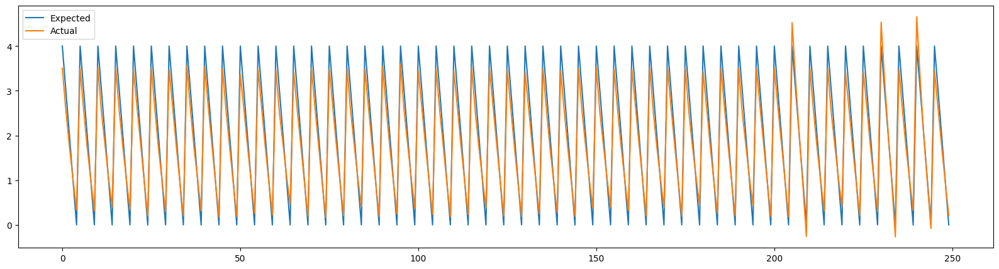

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(test_pred_y_9[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

In [ ]:
attack_rmse

[0.1343929695613114,
 0.19043318457061217,
 0.250513243062039,
 0.3074665537459912,
 0.3608565307622308]

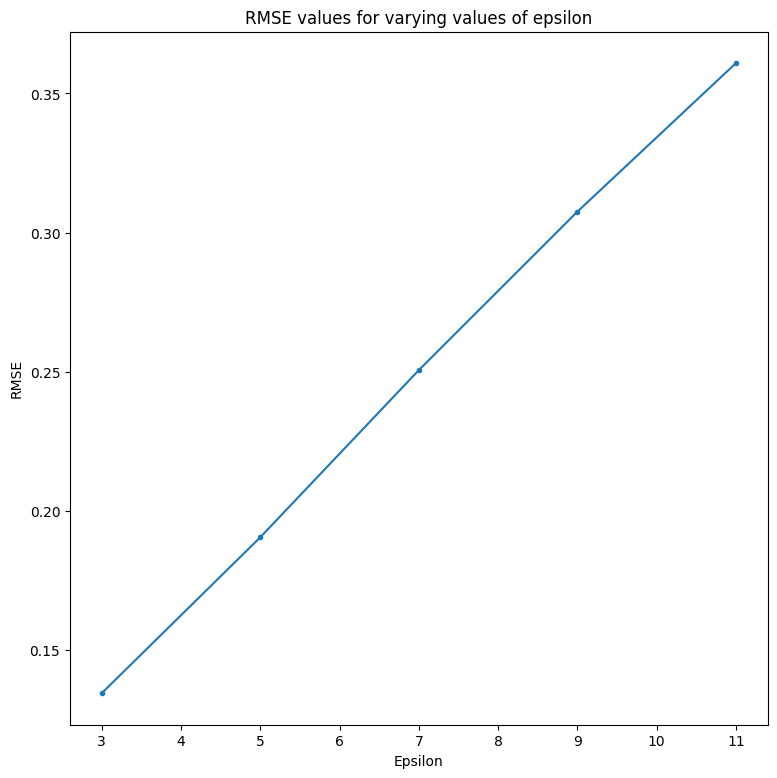

In [ ]:
epsilon_x_axis = [3, 5, 7, 9, 11]
plt.figure(figsize=(9, 9))
plt.ylabel('RMSE')
plt.xlabel('Epsilon')
plt.title("RMSE values for varying values of epsilon")
plt.plot(epsilon_x_axis, attack_rmse, marker=".",)
plt.show()

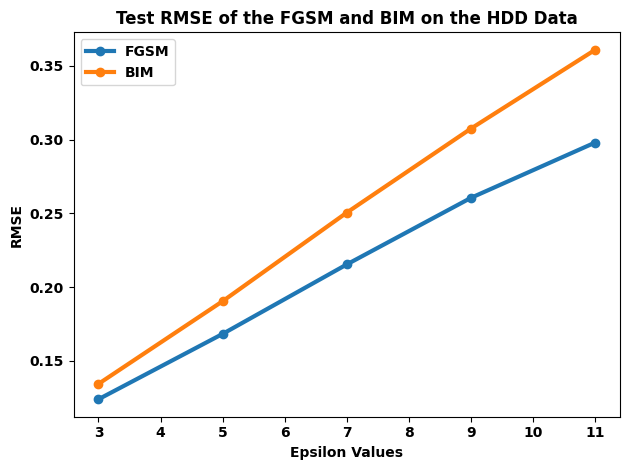

In [ ]:
import matplotlib.pyplot as plt

epsilon = [3, 5, 7, 9, 11]
fgsm = [0.12396734295244921, 0.1682708123920417, 0.21538385625825968, 0.26050956542350867, 0.29798725193795594]
bim = [0.1343929695613114,  0.19043318457061217,  0.250513243062039,  0.3074665537459912,  0.3608565307622308]

# Plotting
plt.plot(epsilon, fgsm, marker='o', label='FGSM', linewidth=3)
plt.plot(epsilon, bim, marker='o', label='BIM', linewidth=3)

# Adding labels and title
plt.xlabel('Epsilon Values', fontweight='bold')
plt.ylabel('RMSE', fontweight='bold')
plt.title('Test RMSE of the FGSM and BIM on the HDD Data', fontweight='bold')

# Setting font size and weight
plt.xticks(fontweight='bold')
plt.yticks(fontweight='bold')

# Adding legend
plt.legend(prop={'weight': 'bold'})

# Save and display the plot
plt.tight_layout()
plt.savefig('hdd-attack.pdf', format='pdf')
plt.show()

## Imperceptibility of attack - Highest order of epsilon vs. train data distribution

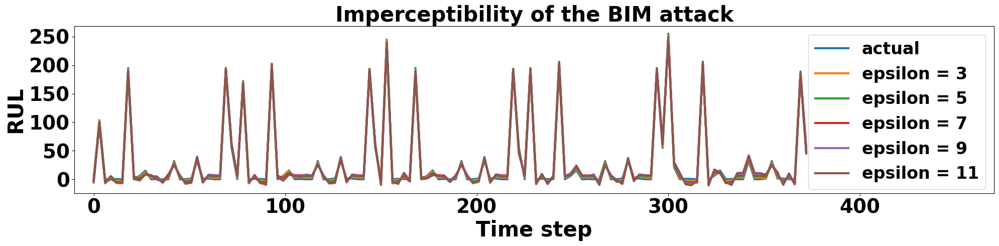

In [ ]:
fig = plt.figure()

actual = np.concatenate(X_test[0: 1]).ravel()
adversarial1= np.concatenate(advX_5[0: 1]).ravel()
adversarial2= np.concatenate(advX_6[0: 1]).ravel()
adversarial3= np.concatenate(advX_7[0: 1]).ravel()
adversarial4= np.concatenate(advX_8[0: 1]).ravel()
adversarial5= np.concatenate(advX_9[0: 1]).ravel()

plt.ylabel('RUL', fontsize=30, fontweight='bold')
plt.xlabel('Time step', fontsize=30, fontweight='bold')
plt.title("Imperceptibility of the BIM attack", fontsize=30, fontweight='bold')

plt.xticks(fontsize=28, fontweight='bold')
plt.yticks(fontsize=28, fontweight='bold')
plt.xlim(-10, 470)

xc = np.arange(len(actual)) * 3
plt.plot(xc, actual, label='actual', linewidth=3)
plt.plot(xc, adversarial1, label='epsilon = 3', linewidth=3)
plt.plot(xc, adversarial2, label='epsilon = 5', linewidth=3)
plt.plot(xc, adversarial3, label='epsilon = 7', linewidth=3)
plt.plot(xc, adversarial4, label='epsilon = 9', linewidth=3)
plt.plot(xc, adversarial5, label='epsilon = 11', linewidth=3)

fig.set_size_inches(20, 5)
plt.legend(loc='upper right', prop={'size': 24, 'weight': 'bold'})

plt.tight_layout()
plt.savefig('hdd-bim-imperceptible.pdf', format='pdf')
plt.show()

### One graph to visualize the attacks with varying epsilon values

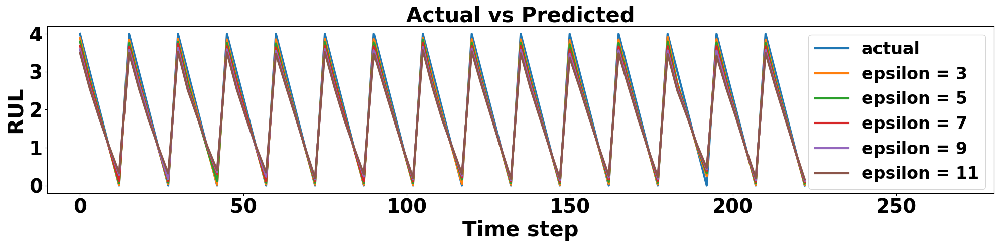

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 15]).ravel()
actual_1 = np.concatenate(test_pred_y_5[0: 15]).ravel()
actual_2 = np.concatenate(test_pred_y_6[0: 15]).ravel()
actual_3 = np.concatenate(test_pred_y_7[0: 15]).ravel()
actual_4 = np.concatenate(test_pred_y_8[0: 15]).ravel()
actual_5 = np.concatenate(test_pred_y_9[0: 15]).ravel()

plt.ylabel('RUL', fontsize=30, fontweight='bold')
plt.xlabel('Time step', fontsize=30, fontweight='bold')
plt.title("Actual vs Predicted", fontsize=30, fontweight='bold')

plt.xticks(fontsize=28, fontweight='bold')
plt.yticks(np.arange(0, 5, 1), fontsize=28, fontweight='bold')
plt.xlim(-10,280)

xc = np.arange(len(expected)) * 3
plt.plot(xc, expected, label='actual', linewidth=3)
plt.plot(xc, actual_1, label='epsilon = 3', linewidth=3)
plt.plot(xc, actual_2, label='epsilon = 5', linewidth=3)
plt.plot(xc, actual_3, label='epsilon = 7', linewidth=3)
plt.plot(xc, actual_4, label='epsilon = 9', linewidth=3)
plt.plot(xc, actual_5, label='epsilon = 11', linewidth=3)

fig.set_size_inches(20, 5)
plt.legend(loc='upper right', prop={'size': 24, 'weight': 'bold'})

plt.tight_layout()
plt.savefig('hdd-bim-curve.pdf', format='pdf')
plt.show()

# Adversarial Training

In [ ]:
import pandas as pd

import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

from tensorflow import keras
from keras.models import Sequential, save_model
from keras.layers import LSTM, Dense, Dropout, RepeatVector, TimeDistributed

In [ ]:
ddf = pd.read_excel("hdd_dataset_5_day.xlsx")

In [ ]:
ddf.shape

(23300, 32)

In [ ]:
ddf.columns[6:-1]

Index(['failure', 'smart_1_raw', 'smart_3_raw', 'smart_4_raw', 'smart_5_raw',
       'smart_7_raw', 'smart_9_raw', 'smart_10_raw', 'smart_12_raw',
       'smart_183_raw', 'smart_184_raw', 'smart_187_raw', 'smart_188_raw',
       'smart_189_raw', 'smart_190_raw', 'smart_191_raw', 'smart_192_raw',
       'smart_193_raw', 'smart_194_raw', 'smart_197_raw', 'smart_198_raw',
       'smart_199_raw', 'smart_240_raw', 'smart_241_raw', 'smart_242_raw'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler((0, 255))

print(ddf[ddf.isnull().any(axis=1)])

cols = ddf.columns[6:-1]

number_of_rows = ddf.shape[0]
time_steps = 5
batch_size = 30
number_of_columns = len(cols)
X = ddf[cols].to_numpy()
Y = ddf[['rul']].to_numpy()

print(X.shape)
print(Y.shape)

X_svr = X.copy()
Y_svr = Y.copy()

# transform data
X = scaler.fit_transform(X)

X = X.reshape((int(number_of_rows/time_steps), time_steps, number_of_columns))
Y = Y.reshape((int(Y.shape[0]/time_steps), time_steps, 1))
# Y = Y[:, -1, :].reshape(-1, 1, 1)

print(Y.shape)

SEED = 50
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.1, random_state=SEED, shuffle=False)
# X_test, X_val, Y_test, Y_val = train_test_split(X_rem, Y_rem, test_size=0.5)

Empty DataFrame
Columns: [Unnamed: 0, index, date, serial_number, model, capacity_bytes, failure, smart_1_raw, smart_3_raw, smart_4_raw, smart_5_raw, smart_7_raw, smart_9_raw, smart_10_raw, smart_12_raw, smart_183_raw, smart_184_raw, smart_187_raw, smart_188_raw, smart_189_raw, smart_190_raw, smart_191_raw, smart_192_raw, smart_193_raw, smart_194_raw, smart_197_raw, smart_198_raw, smart_199_raw, smart_240_raw, smart_241_raw, smart_242_raw, rul]
Index: []

[0 rows x 32 columns]
(23300, 25)
(23300, 1)
(4660, 5, 1)


In [ ]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(4194, 5, 25)
(466, 5, 25)
(4194, 5, 1)
(466, 5, 1)


### Augment the training set with poisoned data


In [ ]:
import tensorflow as tf
import keras
from keras.models import load_model
saved_model = load_model('10_fold_model.34-0.00.h5')

In [ ]:
saved_model.compile(optimizer='adam', loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

In [ ]:
def bim_attack(model, epsilon, data, label, alpha):
  import numpy as np
  import tensorflow as tf
  data = tf.convert_to_tensor(data)
  i = 1
  I = min(4 + epsilon/alpha, 1.25 * epsilon/alpha)
  # I = 20
  print(I)
  # epsilon_scaled = np.full((data.shape[0], data.shape[1], data.shape[2]), epsilon)
  # epsilon_scaled = tf.convert_to_tensor(epsilon_scaled)
  # print(epsilon_scaled.shape)
  while(i<=I):
    with tf.GradientTape() as tape:
      tape.watch(data)
      predictions = model(data)
      print("Predictions", predictions)
      loss = tf.keras.losses.MSE(label, predictions)
    gradient = tape.gradient(loss, data)
    print(gradient.shape)
    advX = data + (alpha * np.sign(gradient))
    advX = tf.math.minimum(data + epsilon, tf.math.maximum(data - epsilon, advX))
    data = advX
    # advX = np.where(advX > data+epsilon, data+epsilon, advX)
    # advX = np.where(advX < data-epsilon, data-epsilon, advX)
    i+=1
  return advX

In [ ]:
train_X_tensor = tf.convert_to_tensor(X_train)
advX_10 = bim_attack(saved_model, 3, X_train, Y_train, 0.01)
advX_11 = bim_attack(saved_model, 5, X_train, Y_train, 0.01)
advX_12 = bim_attack(saved_model, 7, X_train, Y_train, 0.01)
advX_13 = bim_attack(saved_model, 9, X_train, Y_train, 0.01)
advX_14 = bim_attack(saved_model, 11, X_train, Y_train, 0.01)

train_dataset_X = tf.concat([train_X_tensor, advX_10, advX_11, advX_12, advX_13, advX_14], axis=0)
print(train_dataset_X.shape)
train_y_tensor = tf.convert_to_tensor(Y_train)
train_dataset_y = tf.concat([train_y_tensor, train_y_tensor, train_y_tensor, train_y_tensor, train_y_tensor, train_y_tensor], axis=0)
print(train_dataset_y.shape)

Streaming output truncated to the last 5000 lines.
 [[3.5449677 ]
  [2.5992599 ]
  [1.7585908 ]
  [0.9977556 ]
  [0.2560615 ]]], shape=(4194, 5, 1), dtype=float32)
(4194, 5, 25)
Predictions tf.Tensor(
[[[3.1874866 ]
  [2.5635    ]
  [1.7261922 ]
  [1.0227331 ]
  [0.22991759]]

 [[3.3325336 ]
  [2.4724562 ]
  [1.6458552 ]
  [0.910446  ]
  [0.15711308]]

 [[3.4751894 ]
  [2.6025767 ]
  [1.8306072 ]
  [0.99429345]
  [0.15608978]]

 ...

 [[3.5210862 ]
  [2.65238   ]
  [1.814297  ]
  [0.98369354]
  [0.18738335]]

 [[3.535111  ]
  [2.6616602 ]
  [1.8253715 ]
  [0.9853706 ]
  [0.17322254]]

 [[3.5445673 ]
  [2.5986106 ]
  [1.7581892 ]
  [0.99793017]
  [0.257074  ]]], shape=(4194, 5, 1), dtype=float32)
(4194, 5, 25)
Predictions tf.Tensor(
[[[3.1867309 ]
  [2.5631852 ]
  [1.7261174 ]
  [1.0227954 ]
  [0.23017883]]

 [[3.3320599 ]
  [2.472178  ]
  [1.6457174 ]
  [0.91043437]
  [0.15716451]]

 [[3.4746506 ]
  [2.602343  ]
  [1.8305514 ]
  [0.9943493 ]
  [0.15625966]]

 ...

 [[3.5206609 ]
  [2.6

### Define the LSTM model architecture

---



In [ ]:
from tensorflow import keras
from keras.models import Sequential, save_model
from keras.layers import LSTM, Dense, Dropout, Bidirectional

def create_model_as_m1(t_steps, n_columns):
    m1 = Sequential()
    m1.add(LSTM(100, activation='relu', input_shape=(t_steps, n_columns)))
    m1.add(RepeatVector(t_steps))
    m1.add(LSTM(100, activation='relu', return_sequences=True))
    m1.add(Dropout(0.10))
    m1.add(TimeDistributed(Dense(1)))
    print(m1.summary())

    m1.compile(optimizer='adam', loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

    return m1

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               50400     
                                                                 
 repeat_vector (RepeatVecto  (None, 5, 100)            0         
 r)                                                              
                                                                 
 lstm_1 (LSTM)               (None, 5, 100)            80400     
                                                                 
 dropout (Dropout)           (None, 5, 100)            0         
                                                                 
 time_distributed (TimeDist  (None, 5, 1)              101       
 ributed)                                                        
                                                                 
Total params: 130901 (511.33 KB)
Trainable params: 13090

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


72/72 - 3s - loss: 1.0397 - root_mean_squared_error: 1.0197 - val_loss: 0.9408 - val_root_mean_squared_error: 0.9700 - 3s/epoch - 46ms/step
Epoch 3/100
72/72 - 6s - loss: 0.5460 - root_mean_squared_error: 0.7389 - val_loss: 0.4177 - val_root_mean_squared_error: 0.6463 - 6s/epoch - 87ms/step
Epoch 4/100
72/72 - 3s - loss: 0.2629 - root_mean_squared_error: 0.5128 - val_loss: 0.5433 - val_root_mean_squared_error: 0.7371 - 3s/epoch - 44ms/step
Epoch 5/100
72/72 - 6s - loss: 0.2367 - root_mean_squared_error: 0.4865 - val_loss: 0.3094 - val_root_mean_squared_error: 0.5563 - 6s/epoch - 81ms/step
Epoch 6/100
72/72 - 3s - loss: 0.2339 - root_mean_squared_error: 0.4837 - val_loss: 0.2140 - val_root_mean_squared_error: 0.4626 - 3s/epoch - 46ms/step
Epoch 7/100
72/72 - 3s - loss: 0.4877 - root_mean_squared_error: 0.6984 - val_loss: 2.1562 - val_root_mean_squared_error: 1.4684 - 3s/epoch - 45ms/step
Epoch 8/100
72/72 - 4s - loss: 1.4422 - root_mean_squared_error: 1.2009 - val_loss: 2.2703 - val_roo

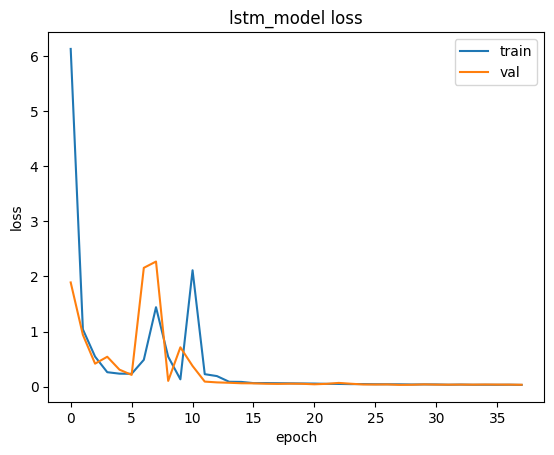

Fold 1:
  Train: index=[   0    1    2 ... 4578 4579 4580]
  Test:  index=[4581 4582 4583 ... 6865 6866 6867]
(4580, 5, 25)
(4580, 5, 1)
Epoch 1/100
144/144 - 4s - loss: 0.0448 - root_mean_squared_error: 0.2116 - val_loss: 0.0191 - val_root_mean_squared_error: 0.1381 - 4s/epoch - 25ms/step
Epoch 2/100


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


144/144 - 7s - loss: 0.0426 - root_mean_squared_error: 0.2064 - val_loss: 0.0202 - val_root_mean_squared_error: 0.1422 - 7s/epoch - 45ms/step
Epoch 3/100
144/144 - 4s - loss: 0.0439 - root_mean_squared_error: 0.2094 - val_loss: 0.0119 - val_root_mean_squared_error: 0.1090 - 4s/epoch - 28ms/step
Epoch 4/100
144/144 - 4s - loss: 0.0321 - root_mean_squared_error: 0.1792 - val_loss: 0.0109 - val_root_mean_squared_error: 0.1043 - 4s/epoch - 27ms/step
Epoch 5/100
144/144 - 4s - loss: 0.0314 - root_mean_squared_error: 0.1771 - val_loss: 0.0079 - val_root_mean_squared_error: 0.0889 - 4s/epoch - 28ms/step
Epoch 6/100
144/144 - 4s - loss: 0.0284 - root_mean_squared_error: 0.1684 - val_loss: 0.0080 - val_root_mean_squared_error: 0.0892 - 4s/epoch - 25ms/step
Epoch 7/100
144/144 - 4s - loss: 0.0282 - root_mean_squared_error: 0.1679 - val_loss: 0.0066 - val_root_mean_squared_error: 0.0814 - 4s/epoch - 27ms/step
Epoch 8/100
144/144 - 4s - loss: 0.0254 - root_mean_squared_error: 0.1595 - val_loss: 0.

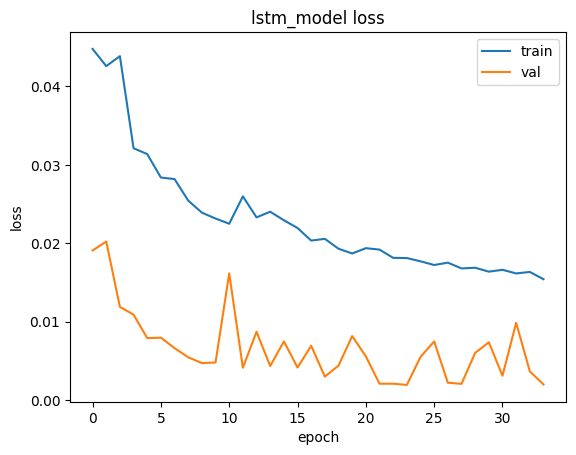

Fold 2:
  Train: index=[   0    1    2 ... 6865 6866 6867]
  Test:  index=[6868 6869 6870 ... 9152 9153 9154]
(6867, 5, 25)
(6867, 5, 1)
Epoch 1/100
215/215 - 5s - loss: 0.0152 - root_mean_squared_error: 0.1234 - val_loss: 0.0014 - val_root_mean_squared_error: 0.0377 - 5s/epoch - 25ms/step
Epoch 2/100


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


215/215 - 5s - loss: 0.0150 - root_mean_squared_error: 0.1225 - val_loss: 0.0065 - val_root_mean_squared_error: 0.0803 - 5s/epoch - 21ms/step
Epoch 3/100
215/215 - 5s - loss: 0.0166 - root_mean_squared_error: 0.1289 - val_loss: 0.0038 - val_root_mean_squared_error: 0.0618 - 5s/epoch - 21ms/step
Epoch 4/100
215/215 - 5s - loss: 0.0153 - root_mean_squared_error: 0.1235 - val_loss: 0.0037 - val_root_mean_squared_error: 0.0609 - 5s/epoch - 21ms/step
Epoch 5/100
215/215 - 4s - loss: 0.0152 - root_mean_squared_error: 0.1232 - val_loss: 0.0021 - val_root_mean_squared_error: 0.0458 - 4s/epoch - 18ms/step
Epoch 6/100
215/215 - 5s - loss: 0.0146 - root_mean_squared_error: 0.1208 - val_loss: 0.0180 - val_root_mean_squared_error: 0.1340 - 5s/epoch - 22ms/step
Epoch 7/100
215/215 - 4s - loss: 0.0271 - root_mean_squared_error: 0.1645 - val_loss: 0.0049 - val_root_mean_squared_error: 0.0697 - 4s/epoch - 18ms/step
Epoch 8/100
215/215 - 5s - loss: 0.0207 - root_mean_squared_error: 0.1439 - val_loss: 0.

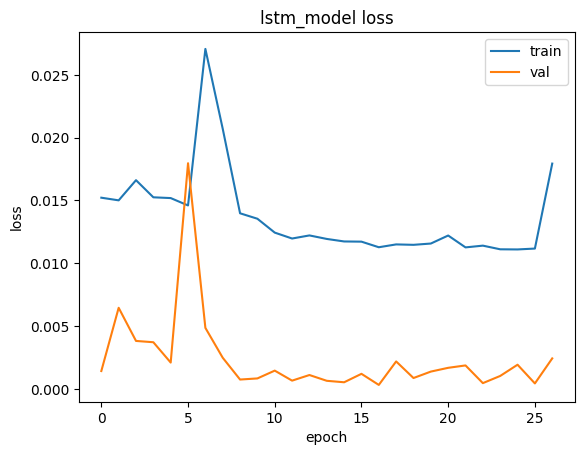

Fold 3:
  Train: index=[   0    1    2 ... 9152 9153 9154]
  Test:  index=[ 9155  9156  9157 ... 11439 11440 11441]
(9154, 5, 25)
(9154, 5, 1)
Epoch 1/100
287/287 - 5s - loss: 0.0113 - root_mean_squared_error: 0.1063 - val_loss: 0.0026 - val_root_mean_squared_error: 0.0511 - 5s/epoch - 19ms/step
Epoch 2/100


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


287/287 - 5s - loss: 0.0105 - root_mean_squared_error: 0.1023 - val_loss: 0.0014 - val_root_mean_squared_error: 0.0375 - 5s/epoch - 19ms/step
Epoch 3/100
287/287 - 5s - loss: 0.0102 - root_mean_squared_error: 0.1009 - val_loss: 5.5449e-04 - val_root_mean_squared_error: 0.0235 - 5s/epoch - 18ms/step
Epoch 4/100
287/287 - 5s - loss: 0.0106 - root_mean_squared_error: 0.1028 - val_loss: 0.0043 - val_root_mean_squared_error: 0.0654 - 5s/epoch - 19ms/step
Epoch 5/100
287/287 - 6s - loss: 0.0102 - root_mean_squared_error: 0.1010 - val_loss: 0.0025 - val_root_mean_squared_error: 0.0497 - 6s/epoch - 19ms/step
Epoch 6/100
287/287 - 5s - loss: 0.0100 - root_mean_squared_error: 0.0998 - val_loss: 3.4360e-04 - val_root_mean_squared_error: 0.0185 - 5s/epoch - 19ms/step
Epoch 7/100
287/287 - 6s - loss: 0.0101 - root_mean_squared_error: 0.1005 - val_loss: 0.0020 - val_root_mean_squared_error: 0.0442 - 6s/epoch - 21ms/step
Epoch 8/100
287/287 - 4s - loss: 0.0099 - root_mean_squared_error: 0.0997 - val_

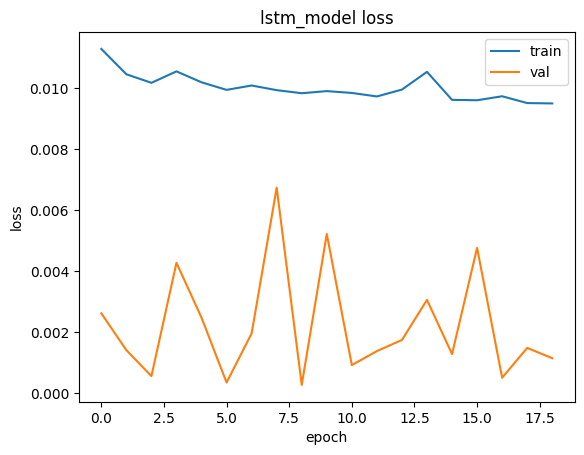

Fold 4:
  Train: index=[    0     1     2 ... 11439 11440 11441]
  Test:  index=[11442 11443 11444 ... 13726 13727 13728]
(11441, 5, 25)
(11441, 5, 1)
Epoch 1/100
358/358 - 6s - loss: 0.0093 - root_mean_squared_error: 0.0967 - val_loss: 1.3179e-04 - val_root_mean_squared_error: 0.0115 - 6s/epoch - 17ms/step
Epoch 2/100


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


358/358 - 5s - loss: 0.0095 - root_mean_squared_error: 0.0977 - val_loss: 0.0013 - val_root_mean_squared_error: 0.0365 - 5s/epoch - 15ms/step
Epoch 3/100
358/358 - 5s - loss: 0.0117 - root_mean_squared_error: 0.1080 - val_loss: 0.0015 - val_root_mean_squared_error: 0.0390 - 5s/epoch - 13ms/step
Epoch 4/100
358/358 - 6s - loss: 0.0097 - root_mean_squared_error: 0.0983 - val_loss: 4.8834e-04 - val_root_mean_squared_error: 0.0221 - 6s/epoch - 16ms/step
Epoch 5/100
358/358 - 6s - loss: 0.0094 - root_mean_squared_error: 0.0970 - val_loss: 0.0010 - val_root_mean_squared_error: 0.0318 - 6s/epoch - 18ms/step
Epoch 6/100
358/358 - 6s - loss: 0.0097 - root_mean_squared_error: 0.0983 - val_loss: 4.8590e-04 - val_root_mean_squared_error: 0.0220 - 6s/epoch - 16ms/step
Epoch 7/100
358/358 - 6s - loss: 0.0093 - root_mean_squared_error: 0.0966 - val_loss: 2.8362e-04 - val_root_mean_squared_error: 0.0168 - 6s/epoch - 18ms/step
Epoch 8/100
358/358 - 6s - loss: 0.0092 - root_mean_squared_error: 0.0960 - 

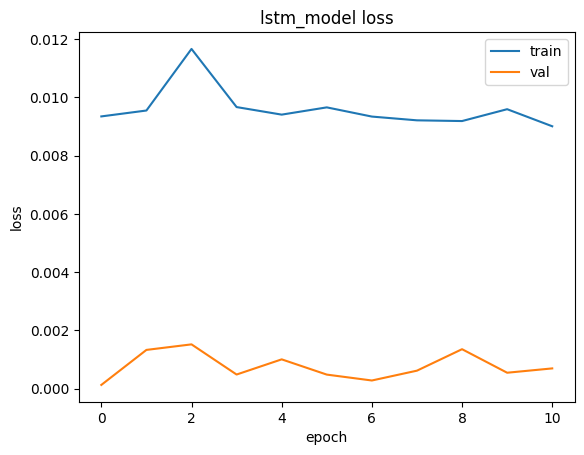

Fold 5:
  Train: index=[    0     1     2 ... 13726 13727 13728]
  Test:  index=[13729 13730 13731 ... 16013 16014 16015]
(13728, 5, 25)
(13728, 5, 1)
Epoch 1/100
429/429 - 6s - loss: 0.0091 - root_mean_squared_error: 0.0952 - val_loss: 1.1097e-04 - val_root_mean_squared_error: 0.0105 - 6s/epoch - 15ms/step
Epoch 2/100


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


429/429 - 5s - loss: 0.0092 - root_mean_squared_error: 0.0957 - val_loss: 5.6262e-04 - val_root_mean_squared_error: 0.0237 - 5s/epoch - 12ms/step
Epoch 3/100
429/429 - 7s - loss: 0.0089 - root_mean_squared_error: 0.0945 - val_loss: 9.0740e-04 - val_root_mean_squared_error: 0.0301 - 7s/epoch - 16ms/step
Epoch 4/100
429/429 - 5s - loss: 0.0091 - root_mean_squared_error: 0.0955 - val_loss: 8.5995e-05 - val_root_mean_squared_error: 0.0093 - 5s/epoch - 12ms/step
Epoch 5/100
429/429 - 6s - loss: 0.0092 - root_mean_squared_error: 0.0962 - val_loss: 2.1752e-04 - val_root_mean_squared_error: 0.0147 - 6s/epoch - 13ms/step
Epoch 6/100
429/429 - 5s - loss: 0.0091 - root_mean_squared_error: 0.0954 - val_loss: 0.0010 - val_root_mean_squared_error: 0.0317 - 5s/epoch - 13ms/step
Epoch 7/100
429/429 - 5s - loss: 0.0089 - root_mean_squared_error: 0.0946 - val_loss: 9.5214e-04 - val_root_mean_squared_error: 0.0309 - 5s/epoch - 12ms/step
Epoch 8/100
429/429 - 6s - loss: 0.0088 - root_mean_squared_error: 0

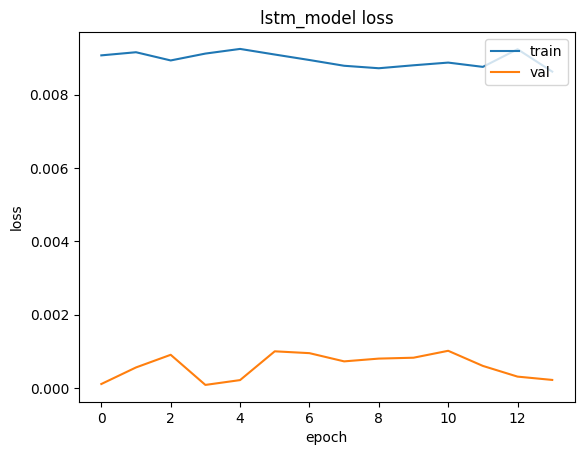

Fold 6:
  Train: index=[    0     1     2 ... 16013 16014 16015]
  Test:  index=[16016 16017 16018 ... 18300 18301 18302]
(16015, 5, 25)
(16015, 5, 1)
Epoch 1/100
501/501 - 6s - loss: 0.0086 - root_mean_squared_error: 0.0929 - val_loss: 5.3937e-04 - val_root_mean_squared_error: 0.0232 - 6s/epoch - 13ms/step
Epoch 2/100


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


501/501 - 7s - loss: 0.0087 - root_mean_squared_error: 0.0930 - val_loss: 5.6569e-04 - val_root_mean_squared_error: 0.0238 - 7s/epoch - 14ms/step
Epoch 3/100
501/501 - 6s - loss: 0.0086 - root_mean_squared_error: 0.0930 - val_loss: 7.0413e-04 - val_root_mean_squared_error: 0.0265 - 6s/epoch - 12ms/step
Epoch 4/100
501/501 - 7s - loss: 0.0087 - root_mean_squared_error: 0.0931 - val_loss: 2.4591e-04 - val_root_mean_squared_error: 0.0157 - 7s/epoch - 14ms/step
Epoch 5/100
501/501 - 6s - loss: 0.0086 - root_mean_squared_error: 0.0928 - val_loss: 1.5097e-04 - val_root_mean_squared_error: 0.0123 - 6s/epoch - 12ms/step
Epoch 6/100
501/501 - 7s - loss: 0.0087 - root_mean_squared_error: 0.0931 - val_loss: 8.5867e-04 - val_root_mean_squared_error: 0.0293 - 7s/epoch - 13ms/step
Epoch 7/100
501/501 - 6s - loss: 0.0085 - root_mean_squared_error: 0.0924 - val_loss: 7.0265e-04 - val_root_mean_squared_error: 0.0265 - 6s/epoch - 12ms/step
Epoch 8/100
501/501 - 7s - loss: 0.0084 - root_mean_squared_erro

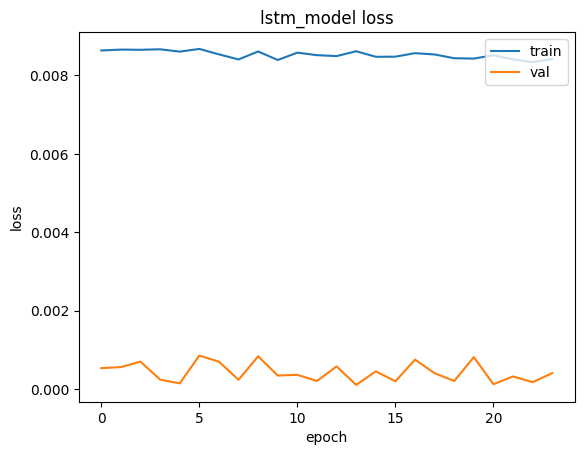

Fold 7:
  Train: index=[    0     1     2 ... 18300 18301 18302]
  Test:  index=[18303 18304 18305 ... 20587 20588 20589]
(18302, 5, 25)
(18302, 5, 1)
Epoch 1/100
572/572 - 7s - loss: 0.0084 - root_mean_squared_error: 0.0915 - val_loss: 1.7022e-04 - val_root_mean_squared_error: 0.0130 - 7s/epoch - 13ms/step
Epoch 2/100


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


572/572 - 6s - loss: 0.0086 - root_mean_squared_error: 0.0925 - val_loss: 9.0174e-05 - val_root_mean_squared_error: 0.0095 - 6s/epoch - 11ms/step
Epoch 3/100
572/572 - 7s - loss: 0.0082 - root_mean_squared_error: 0.0906 - val_loss: 0.0011 - val_root_mean_squared_error: 0.0327 - 7s/epoch - 12ms/step
Epoch 4/100
572/572 - 6s - loss: 0.0083 - root_mean_squared_error: 0.0911 - val_loss: 4.2068e-04 - val_root_mean_squared_error: 0.0205 - 6s/epoch - 10ms/step
Epoch 5/100
572/572 - 7s - loss: 0.0082 - root_mean_squared_error: 0.0907 - val_loss: 1.2842e-04 - val_root_mean_squared_error: 0.0113 - 7s/epoch - 12ms/step
Epoch 6/100
572/572 - 6s - loss: 0.0082 - root_mean_squared_error: 0.0907 - val_loss: 7.7338e-04 - val_root_mean_squared_error: 0.0278 - 6s/epoch - 10ms/step
Epoch 7/100
572/572 - 7s - loss: 0.0083 - root_mean_squared_error: 0.0911 - val_loss: 1.9155e-04 - val_root_mean_squared_error: 0.0138 - 7s/epoch - 12ms/step
Epoch 8/100
572/572 - 6s - loss: 0.0083 - root_mean_squared_error: 0

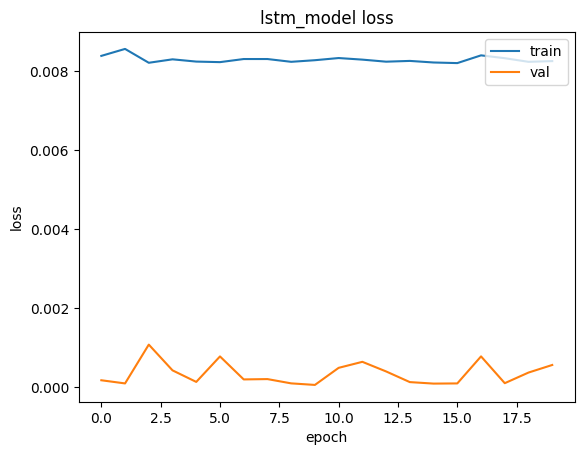

Fold 8:
  Train: index=[    0     1     2 ... 20587 20588 20589]
  Test:  index=[20590 20591 20592 ... 22874 22875 22876]
(20589, 5, 25)
(20589, 5, 1)
Epoch 1/100
644/644 - 7s - loss: 0.0083 - root_mean_squared_error: 0.0912 - val_loss: 4.8215e-04 - val_root_mean_squared_error: 0.0220 - 7s/epoch - 11ms/step
Epoch 2/100


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


644/644 - 7s - loss: 0.0082 - root_mean_squared_error: 0.0905 - val_loss: 3.3418e-04 - val_root_mean_squared_error: 0.0183 - 7s/epoch - 11ms/step
Epoch 3/100
644/644 - 6s - loss: 0.0082 - root_mean_squared_error: 0.0904 - val_loss: 0.0010 - val_root_mean_squared_error: 0.0319 - 6s/epoch - 10ms/step
Epoch 4/100
644/644 - 7s - loss: 0.0082 - root_mean_squared_error: 0.0903 - val_loss: 3.5670e-04 - val_root_mean_squared_error: 0.0189 - 7s/epoch - 11ms/step
Epoch 5/100
644/644 - 6s - loss: 0.0081 - root_mean_squared_error: 0.0903 - val_loss: 1.0916e-04 - val_root_mean_squared_error: 0.0104 - 6s/epoch - 10ms/step
Epoch 6/100
644/644 - 7s - loss: 0.0082 - root_mean_squared_error: 0.0908 - val_loss: 3.1549e-04 - val_root_mean_squared_error: 0.0178 - 7s/epoch - 11ms/step
Epoch 7/100
644/644 - 7s - loss: 0.0082 - root_mean_squared_error: 0.0905 - val_loss: 1.4827e-04 - val_root_mean_squared_error: 0.0122 - 7s/epoch - 11ms/step
Epoch 8/100
644/644 - 7s - loss: 0.0083 - root_mean_squared_error: 0

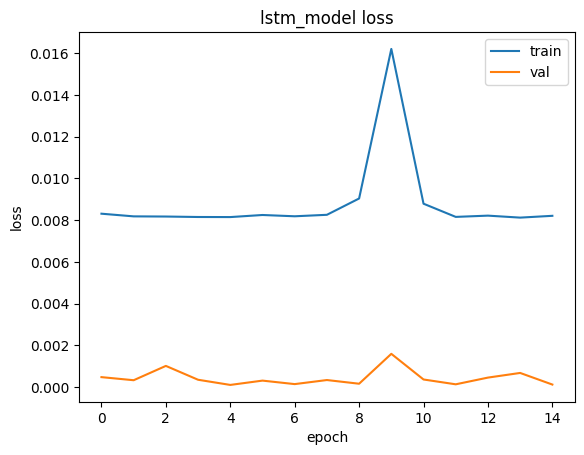

Fold 9:
  Train: index=[    0     1     2 ... 22874 22875 22876]
  Test:  index=[22877 22878 22879 ... 25161 25162 25163]
(22876, 5, 25)
(22876, 5, 1)
Epoch 1/100
715/715 - 8s - loss: 0.0081 - root_mean_squared_error: 0.0901 - val_loss: 7.8811e-05 - val_root_mean_squared_error: 0.0089 - 8s/epoch - 11ms/step
Epoch 2/100


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


715/715 - 8s - loss: 0.0083 - root_mean_squared_error: 0.0909 - val_loss: 3.4043e-04 - val_root_mean_squared_error: 0.0185 - 8s/epoch - 11ms/step
Epoch 3/100
715/715 - 7s - loss: 0.0081 - root_mean_squared_error: 0.0901 - val_loss: 1.8660e-04 - val_root_mean_squared_error: 0.0137 - 7s/epoch - 10ms/step
Epoch 4/100
715/715 - 8s - loss: 0.0082 - root_mean_squared_error: 0.0903 - val_loss: 2.0528e-04 - val_root_mean_squared_error: 0.0143 - 8s/epoch - 11ms/step
Epoch 5/100
715/715 - 8s - loss: 0.0083 - root_mean_squared_error: 0.0912 - val_loss: 3.7640e-04 - val_root_mean_squared_error: 0.0194 - 8s/epoch - 11ms/step
Epoch 6/100
715/715 - 7s - loss: 0.0082 - root_mean_squared_error: 0.0907 - val_loss: 0.0019 - val_root_mean_squared_error: 0.0430 - 7s/epoch - 10ms/step
Epoch 7/100
715/715 - 8s - loss: 0.0083 - root_mean_squared_error: 0.0910 - val_loss: 5.2761e-04 - val_root_mean_squared_error: 0.0230 - 8s/epoch - 11ms/step
Epoch 8/100
715/715 - 7s - loss: 0.0082 - root_mean_squared_error: 0

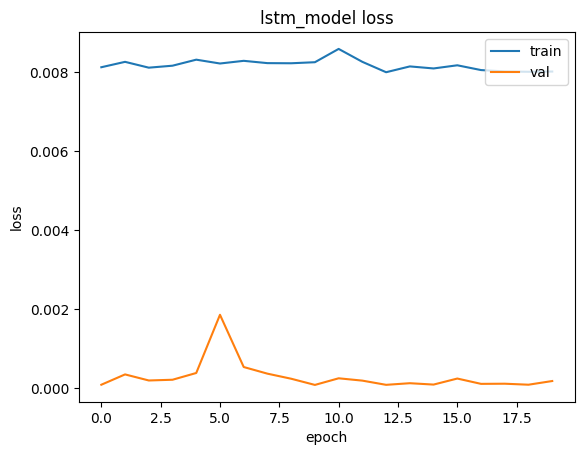

Train RMSE [0.06288070231676102, 0.037662323564291, 0.038961853832006454, 0.03340782970190048, 0.029882051050662994, 0.014723513275384903, 0.019704315811395645, 0.02305704914033413, 0.011170350946485996, 0.013510054908692837]
Validation RMSE [0.1881875842809677, 0.04452666640281677, 0.049258217215538025, 0.03379398211836815, 0.026427580043673515, 0.0149045055732131, 0.02028326503932476, 0.02360071986913681, 0.01125464215874672, 0.01314703281968832]


In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping
from sklearn.model_selection import TimeSeriesSplit
import numpy as np
from sklearn.metrics import mean_squared_error


# batch_size = 128
time_steps = train_dataset_X.shape[1]
number_of_rows = train_dataset_X.shape[0]
number_of_columns = train_dataset_X.shape[2]

model_path = '/content/drive/MyDrive/LSTM_BackBlaze/bim_adversarial_training_data_augment'
my_callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=10),
    tf.keras.callbacks.ModelCheckpoint(filepath='bim_data_augmented_model.{epoch:02d}-{val_loss:.2f}.h5'),
    tf.keras.callbacks.TensorBoard(log_dir='./logs'),
]
rmse_train = []
rmse_val = []
lstm_model = create_model_as_m1(time_steps, number_of_columns)
tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=None)
print(tscv)
for i, (train_index, test_index) in enumerate(tscv.split(train_dataset_X)):
  print(f"Fold {i}:")
  print(f"  Train: index={train_index}")
  print(f"  Test:  index={test_index}")
  train_X = train_dataset_X[:train_index[-1]]
  train_y = train_dataset_y[:train_index[-1]]
  print(train_X.shape)
  print(train_y.shape)
  val_X = train_dataset_X[test_index[-1]:]
  val_y = train_dataset_y[test_index[-1]:]
  hist = lstm_model.fit(train_X, train_y, epochs=100, validation_data=(val_X, val_y), callbacks=my_callbacks, verbose=2)
  lstm_model.save(model_path)

  rmse_train.append(lstm_model.evaluate(train_X, train_y)[1])

  rmse_val.append(lstm_model.evaluate(val_X, val_y)[1])

  plt.plot(hist.history['loss'])
  plt.plot(hist.history['val_loss'])
  plt.title('lstm_model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper right')
  plt.show()

print("Train RMSE", rmse_train)
print("Validation RMSE", rmse_val)

In [ ]:
print("Train RMSE", np.mean(rmse_train))
print("Validation RMSE", np.mean(rmse_val))

Train RMSE 0.028496004454791547
Validation RMSE 0.04253841955214739


In [ ]:
lstm_model.evaluate(X_test,Y_test)

15/15 [==============================] - 0s 5ms/step - loss: 1.6538e-04 - root_mean_squared_error: 0.0129


[0.00016538132331334054, 0.012860066257417202]

In [ ]:
Y_pred = lstm_model.predict(X_test)

15/15 [==============================] - 0s 5ms/step


In [ ]:
Y_pred.shape

(466, 5, 1)

In [ ]:
Y_test.shape

(466, 5, 1)

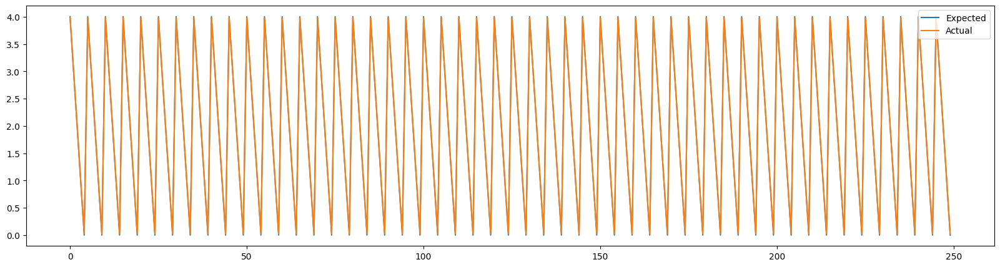

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(Y_pred[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

### Test the robust model on test data augmented with poisoned data

In [ ]:
test_X_tensor = tf.convert_to_tensor(X_test)
advX_15 = bim_attack(saved_model, 3, X_test, Y_test, 0.01)
advX_16 = bim_attack(saved_model, 5, X_test, Y_test, 0.01)
advX_17 = bim_attack(saved_model, 7, X_test, Y_test, 0.01)
advX_18 = bim_attack(saved_model, 9, X_test, Y_test, 0.01)
advX_19 = bim_attack(saved_model, 11, X_test, Y_test, 0.01)

test_dataset_X = tf.concat([test_X_tensor, advX_15, advX_16, advX_17, advX_18, advX_19], axis=0)
print(test_dataset_X.shape)
test_y_tensor = tf.convert_to_tensor(Y_test)
test_dataset_y = tf.concat([test_y_tensor, test_y_tensor, test_y_tensor, test_y_tensor, test_y_tensor, test_y_tensor], axis=0)
print(test_dataset_y.shape)

Streaming output truncated to the last 5000 lines.
 [[3.5760746 ]
  [2.468243  ]
  [1.7591562 ]
  [1.0492498 ]
  [0.37129217]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.5582922 ]
  [2.587779  ]
  [1.767134  ]
  [1.0153377 ]
  [0.30443388]]

 [[3.5432456 ]
  [2.6177924 ]
  [1.7583542 ]
  [0.9878736 ]
  [0.22429353]]

 [[3.5883605 ]
  [2.5440102 ]
  [1.7961779 ]
  [1.0283135 ]
  [0.37423253]]

 ...

 [[3.5541725 ]
  [2.544948  ]
  [1.7912297 ]
  [1.0382934 ]
  [0.38048166]]

 [[3.4308553 ]
  [2.5957546 ]
  [1.7079686 ]
  [0.95508224]
  [0.16605717]]

 [[3.5755014 ]
  [2.4679644 ]
  [1.7590568 ]
  [1.0493191 ]
  [0.3714884 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.5579228 ]
  [2.5875568 ]
  [1.7670896 ]
  [1.0153993 ]
  [0.30467725]]

 [[3.5428374 ]
  [2.617104  ]
  [1.7577419 ]
  [0.9880556 ]
  [0.22530735]]

 [[3.5879395 ]
  [2.5437553 ]
  [1.7960694 ]
  [1.0283473 ]
  [0.37444282]]

 ...

 [[3.5536413 ]
  [2.54476

In [ ]:
lstm_model.evaluate(test_dataset_X,test_dataset_y)

88/88 [==============================] - 0s 5ms/step - loss: 1.6986e-04 - root_mean_squared_error: 0.0130


[0.00016986168338917196, 0.013033098541200161]

In [ ]:
pred_y_robust = lstm_model.predict(test_dataset_X)

88/88 [==============================] - 1s 4ms/step


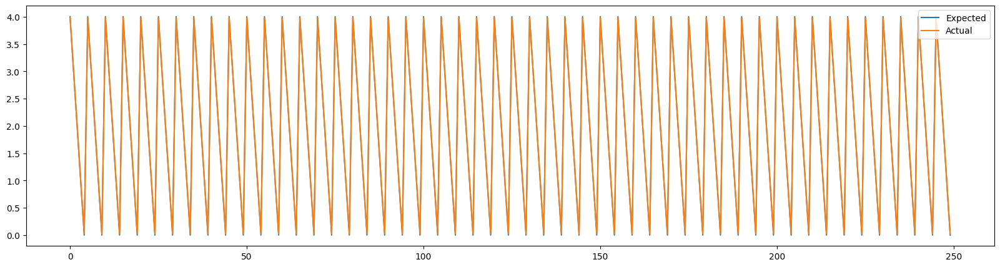

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(pred_y_robust[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

### Run the robust model on original dataset couple with 3 epsilon poisoning

In [ ]:
def rmse(predictions, targets):
    # Compute squared differences
    squared_diff = (predictions - targets) ** 2
    print(squared_diff.shape)
    # Calculate mean of squared differences
    mean_squared_diff = np.mean(squared_diff)
    # Take the square root to get RMSE
    rmse_value = np.sqrt(mean_squared_diff)
    return rmse_value

In [ ]:
lstm_model.evaluate(advX_15, Y_test)

15/15 [==============================] - 0s 5ms/step - loss: 1.6737e-04 - root_mean_squared_error: 0.0129


[0.0001673651859164238, 0.012936968356370926]

In [ ]:
pred_y_robust1 = lstm_model.predict(advX_15)

15/15 [==============================] - 1s 41ms/step


In [ ]:
attack_rmse = []
rmse_10 = rmse(Y_test, pred_y_robust1)
print(rmse_10)
attack_rmse.append(rmse_10)

(466, 5, 1)
0.012936969329385557


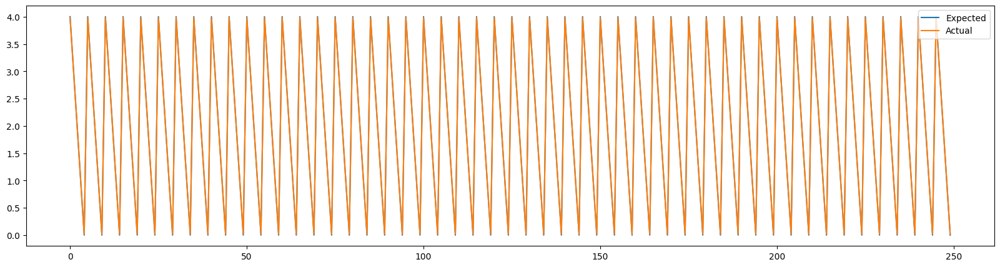

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(pred_y_robust1[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

### Run the robust model on original dataset couple with 5 epsilon poisoning

In [ ]:
lstm_model.evaluate(advX_16, Y_test)

15/15 [==============================] - 0s 5ms/step - loss: 1.6932e-04 - root_mean_squared_error: 0.0130


[0.00016931656864471734, 0.013012170791625977]

In [ ]:
pred_y_robust2 = lstm_model.predict(advX_16)

15/15 [==============================] - 0s 4ms/step


In [ ]:
rmse_11 = rmse(Y_test, pred_y_robust2)
print(rmse_11)
attack_rmse.append(rmse_11)

(466, 5, 1)
0.013012170810684705


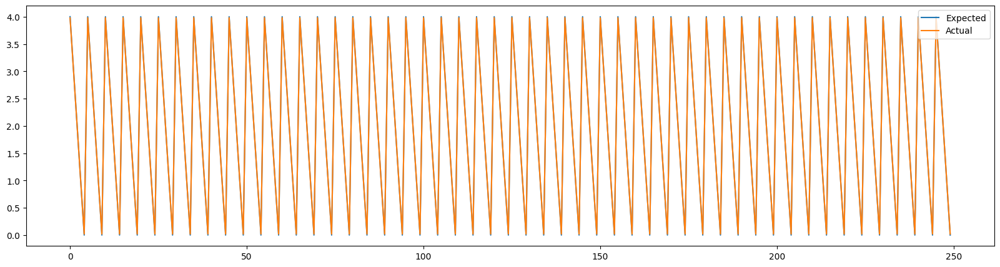

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(pred_y_robust2[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

### Run the robust model on original dataset couple with 7 epsilon poisoning

In [ ]:
lstm_model.evaluate(advX_17, Y_test)

15/15 [==============================] - 0s 5ms/step - loss: 1.7145e-04 - root_mean_squared_error: 0.0131


[0.00017145091260317713, 0.013093926943838596]

In [ ]:
pred_y_robust3 = lstm_model.predict(advX_17)

15/15 [==============================] - 0s 4ms/step


In [ ]:
rmse_12 = rmse(Y_test, pred_y_robust3)
print(rmse_12)
attack_rmse.append(rmse_12)

(466, 5, 1)
0.013093926535394276


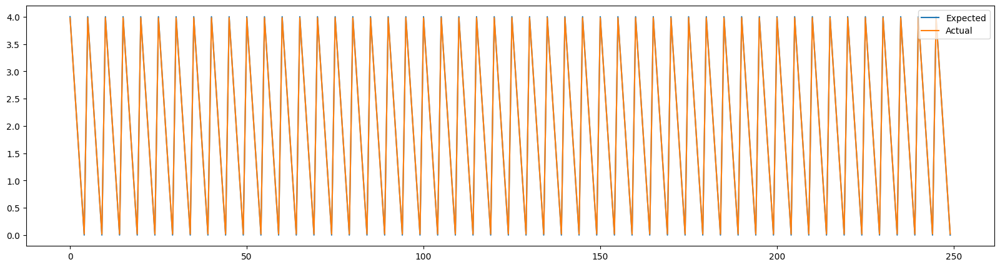

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(pred_y_robust3[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

### Run the robust model on original dataset couple with 9 epsilon poisoning

In [ ]:
lstm_model.evaluate(advX_18, Y_test)

15/15 [==============================] - 0s 7ms/step - loss: 1.7256e-04 - root_mean_squared_error: 0.0131


[0.00017255976854357868, 0.013136199675500393]

In [ ]:
pred_y_robust4 = lstm_model.predict(advX_18)

15/15 [==============================] - 0s 5ms/step


In [ ]:
rmse_13 = rmse(Y_test, pred_y_robust4)
print(rmse_13)
attack_rmse.append(rmse_13)

(466, 5, 1)
0.013136199706089374


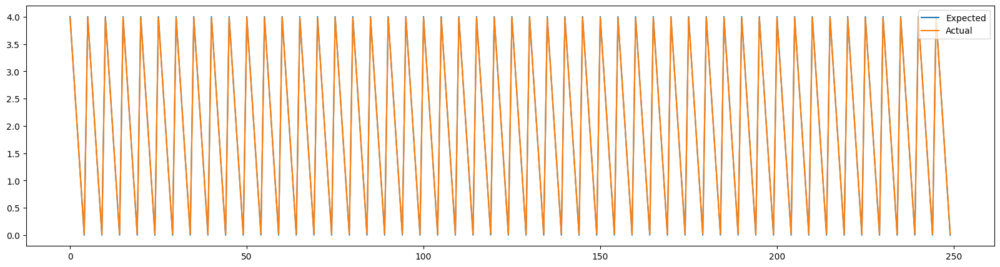

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(pred_y_robust4[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

### Run the robust model on original dataset couple with 11 epsilon poisoning

In [ ]:
lstm_model.evaluate(advX_19, Y_test)

15/15 [==============================] - 0s 5ms/step - loss: 1.7310e-04 - root_mean_squared_error: 0.0132


[0.0001730963122099638, 0.013156607747077942]

In [ ]:
pred_y_robust5 = lstm_model.predict(advX_19)

15/15 [==============================] - 0s 7ms/step


In [ ]:
rmse_14 = rmse(Y_test, pred_y_robust5)
print(rmse_14)
attack_rmse.append(rmse_14)

(466, 5, 1)
0.013156607892231581


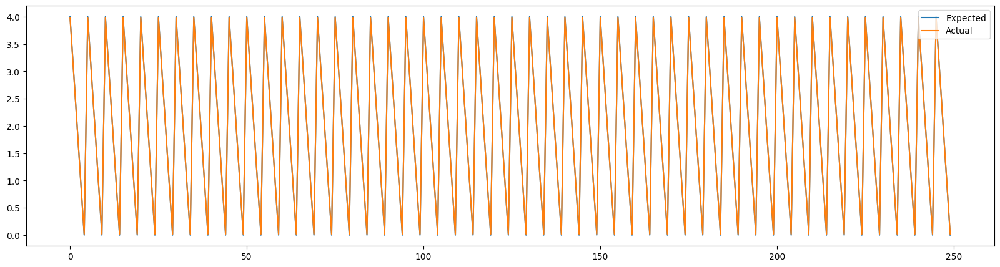

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(pred_y_robust5[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

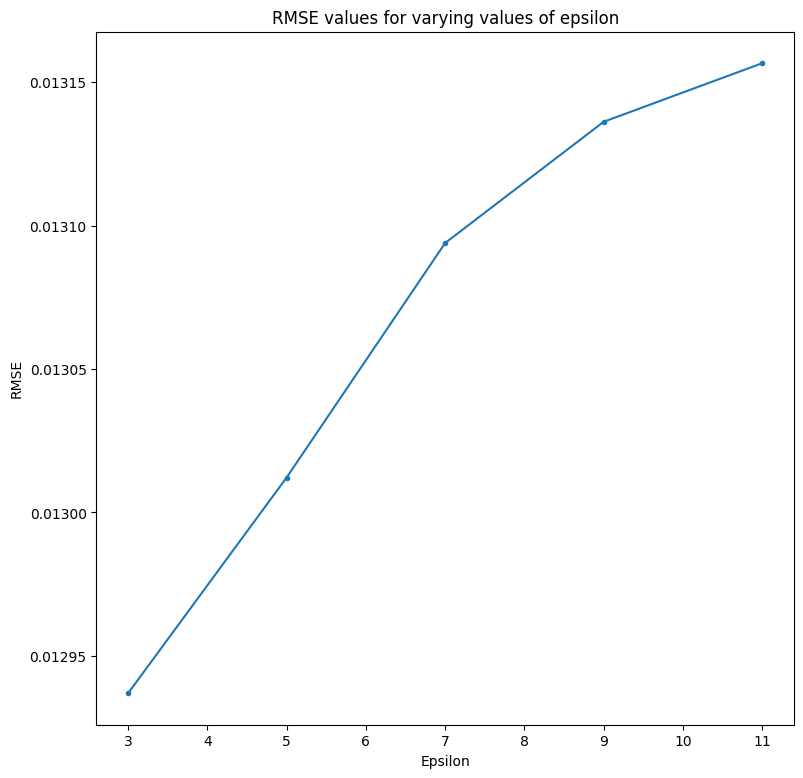

In [ ]:
epsilon = [3, 5, 7, 9, 11]
plt.figure(figsize=(9, 9))
plt.ylabel('RMSE')
plt.xlabel('Epsilon')
plt.title("RMSE values for varying values of epsilon")
plt.plot(epsilon, attack_rmse, marker=".",)
plt.show()

# Adversarial Learning - Actual Reproduction of LPAT paper

In [ ]:
import pandas as pd

import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

from tensorflow import keras
from keras.models import Sequential, save_model
from keras.layers import LSTM, Dense, Dropout, RepeatVector, TimeDistributed

In [ ]:
ddf = pd.read_excel("hdd_dataset_5_day.xlsx")

In [ ]:
ddf.shape

(23300, 32)

In [ ]:
ddf.columns[6:-1]

Index(['failure', 'smart_1_raw', 'smart_3_raw', 'smart_4_raw', 'smart_5_raw',
       'smart_7_raw', 'smart_9_raw', 'smart_10_raw', 'smart_12_raw',
       'smart_183_raw', 'smart_184_raw', 'smart_187_raw', 'smart_188_raw',
       'smart_189_raw', 'smart_190_raw', 'smart_191_raw', 'smart_192_raw',
       'smart_193_raw', 'smart_194_raw', 'smart_197_raw', 'smart_198_raw',
       'smart_199_raw', 'smart_240_raw', 'smart_241_raw', 'smart_242_raw'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler((0, 255))

print(ddf[ddf.isnull().any(axis=1)])

cols = ddf.columns[6:-1]

number_of_rows = ddf.shape[0]
time_steps = 5
batch_size = 30
number_of_columns = len(cols)
X = ddf[cols].to_numpy()
Y = ddf[['rul']].to_numpy()

print(X.shape)
print(Y.shape)

X_svr = X.copy()
Y_svr = Y.copy()

# transform data
X = scaler.fit_transform(X)

X = X.reshape((int(number_of_rows/time_steps), time_steps, number_of_columns))
Y = Y.reshape((int(Y.shape[0]/time_steps), time_steps, 1))
# Y = Y[:, -1, :].reshape(-1, 1, 1)

print(Y.shape)

SEED = 50
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.1, random_state=SEED, shuffle=False)
# X_test, X_val, Y_test, Y_val = train_test_split(X_rem, Y_rem, test_size=0.5)

Empty DataFrame
Columns: [Unnamed: 0, index, date, serial_number, model, capacity_bytes, failure, smart_1_raw, smart_3_raw, smart_4_raw, smart_5_raw, smart_7_raw, smart_9_raw, smart_10_raw, smart_12_raw, smart_183_raw, smart_184_raw, smart_187_raw, smart_188_raw, smart_189_raw, smart_190_raw, smart_191_raw, smart_192_raw, smart_193_raw, smart_194_raw, smart_197_raw, smart_198_raw, smart_199_raw, smart_240_raw, smart_241_raw, smart_242_raw, rul]
Index: []

[0 rows x 32 columns]
(23300, 25)
(23300, 1)
(4660, 5, 1)


In [ ]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(4194, 5, 25)
(466, 5, 25)
(4194, 5, 1)
(466, 5, 1)


In [ ]:
from tensorflow import keras
from keras.models import Sequential, save_model
from keras.layers import LSTM, Dense, Dropout, Bidirectional

def create_model_as_m1(t_steps, n_columns):
    m1 = Sequential()
    m1.add(LSTM(100, activation='relu', input_shape=(t_steps, n_columns)))
    m1.add(RepeatVector(t_steps))
    m1.add(LSTM(100, activation='relu', return_sequences=True))
    m1.add(Dropout(0.10))
    m1.add(TimeDistributed(Dense(1)))
    print(m1.summary())

    m1.compile(optimizer='adam', loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

    return m1

In [ ]:
import tensorflow as tf
# Instantiate an optimizer.
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
# Prepare the metrics.
train_acc_metric = keras.metrics.RootMeanSquaredError()
val_acc_metric = keras.metrics.RootMeanSquaredError()

In [ ]:
time_steps = X_train.shape[1]
number_of_rows = X_train.shape[0]
number_of_columns = X_train.shape[2]
model = create_model_as_m1(time_steps, number_of_columns)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               50400     
                                                                 
 repeat_vector (RepeatVecto  (None, 5, 100)            0         
 r)                                                              
                                                                 
 lstm_1 (LSTM)               (None, 5, 100)            80400     
                                                                 
 dropout (Dropout)           (None, 5, 100)            0         
                                                                 
 time_distributed (TimeDist  (None, 5, 1)              101       
 ributed)                                                        
                                                                 
Total params: 130901 (511.33 KB)
Trainable params: 13090

In [ ]:
def perturb_weights(gradient):
  import numpy as np
  g_perturbed = []
  i=1
  I = min(4 + (7/0.01), 1.25 * (7/0.01))
  while(i<=I):
    gradient_perturbed = []
    final_perturbed_gradient = []
    for j in range(len(gradient)):
      gradient_perturbed.append(gradient[j] + (0.01 * np.sign(gradient[j])))

    for k in range(len(gradient_perturbed)):
      final_perturbed_gradient.append(np.minimum(gradient_perturbed[k]+7, np.maximum(gradient_perturbed[k]-7, gradient[k])))

    gradient = final_perturbed_gradient
    i+=1
  return gradient

In [ ]:
def rmse_metric(predictions, targets):
    # Compute squared differences
    squared_diff = (predictions - targets) ** 2
    print(squared_diff.shape)
    # Calculate mean of squared differences
    mean_squared_diff = np.mean(squared_diff)
    # Take the square root to get RMSE
    rmse_value = np.sqrt(mean_squared_diff)
    return rmse_value

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping
from sklearn.model_selection import TimeSeriesSplit
import numpy as np
from sklearn.metrics import mean_squared_error

def robust_model(model, epochs, X_train, Y_train, optimizer, train_acc_metric, val_acc_metric): #=> gradient

  # epochs = 20
  # data = train_X
  # label = train_y

  tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=None)
  print(tscv)

  rmse_train = []
  rmse_val = []

  for i, (train_index, test_index) in enumerate(tscv.split(X_train)):
    print(f"Fold {i}:")
    print(f"  Train: index={train_index}")
    print(f"  Test:  index={test_index}")
    train_X = X_train[:train_index[-1]]
    train_y = Y_train[:train_index[-1]]
    print(train_X.shape)
    val_X = X_train[test_index[-1]:]
    val_y = Y_train[test_index[-1]:]
    print(Y_train.shape)

    for epoch in range(epochs):
        # print("\nStart of epoch %d" % (epoch,))
        with tf.GradientTape() as tape:
          # tape.watch(data)
          '''  FIRST ROUND OF LPAT:
          1. Perform feedforward process to compute the output of the neural network '''
          predictions = model(train_X, training=True)
          # print("Predictions", predictions)
          loss = tf.keras.losses.MSE(train_y, predictions)
        ''' 2. Perform backpropagation to update parameters (weights) and store gradient in accumulation layers'''
        gradient = tape.gradient(loss, model.trainable_weights)
        # gradient = np.array(gradient)
        # print(gradient.shape)
        optimizer.apply_gradients(zip(gradient, model.trainable_weights))
        # data += gradient[len(gradient)-1]
        ''' 3. Perform layerwise perturbation process based on gradients to each layer, and perform feedforward process to compute new output of the neural network'''
        gradient = perturb_weights(gradient)
        with tf.GradientTape() as tape:
          # tape.watch(data)
          predictions = model(train_X, training=True)
          # print("Predictions", predictions)
          loss = tf.keras.losses.MSE(train_y, predictions)
        ''' Finally, it performs backpropagation again to update parameters of all network layers'''
        gradient = tape.gradient(loss, model.trainable_weights)
        optimizer.apply_gradients(zip(gradient, model.trainable_weights))

        #Update training metric.
        train_acc_metric.update_state(train_y, predictions)

        # data += gradient[len(gradient)-1]

        # with tf.GradientTape() as tape:
        #   # tape.watch(data)
        #   predictions = model(data)
        #   loss = tf.keras.losses.MSE(label, predictions)
        # gradient = tape.gradient(loss, model.trainable_weights)
        # gradient = np.array(gradient)
        # optimizer.apply_gradients(zip(gradient, model.trainable_weights))
        # data += gradient[len(gradient)-1]

        # Log every 10 epochs.
        if epoch % 10 == 0:
            print("Loss", np.mean(loss))
        # Display metrics at the end of each epoch.
        train_acc = train_acc_metric.result()
        print("Training RMSE over epoch: %.4f" % (float(train_acc),))

        # Reset training metrics at the end of each epoch
        train_acc_metric.reset_states()

        # Run a validation loop at the end of each epoch.
        val_logits = model(val_X, training=False)
        # Update val metrics
        val_acc_metric.update_state(val_y, val_logits)
        val_acc = val_acc_metric.result()
        val_acc_metric.reset_states()
        print("Validation RMSE: %.4f" % (float(val_acc),))

    rmse_train.append(rmse_metric(train_y, predictions))

  return rmse_train, predictions

In [ ]:
rmse_train, train_predictions = robust_model(model, 100, X_train, Y_train, optimizer, train_acc_metric, val_acc_metric)

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=None)
Fold 0:
  Train: index=[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222

In [ ]:
rmse_train

[0.50988007,
 0.39798972,
 0.36570096,
 0.37088886,
 0.32505104,
 0.32209688,
 0.31860304,
 0.3124149,
 0.31351912,
 0.30176952]

In [ ]:
print("Train RMSE", np.mean(rmse_train))

Train RMSE 0.35379142


In [ ]:
train_predictions.shape

TensorShape([3812, 5, 1])

In [ ]:
Y_train.shape

(4194, 5, 1)

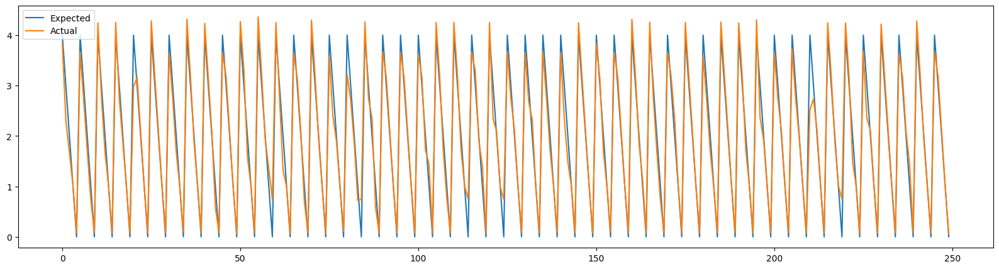

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_train[0: 50]).ravel()
actual = np.concatenate(train_predictions[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

In [ ]:
with tf.GradientTape() as tape:
  # tape.watch(data)
  predictions = model(X_test, training=False)
  # print("Predictions", predictions)
  loss = tf.keras.losses.MSE(Y_test, predictions)
  print(np.mean(loss))

0.008576322


In [ ]:
p = model(X_test,training=False)

In [ ]:
p.shape

TensorShape([466, 5, 1])

In [ ]:
Y_test.shape

(466, 5, 1)

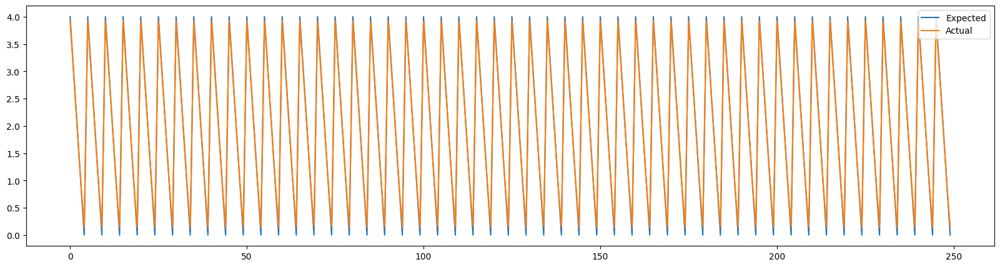

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(predictions[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

In [ ]:
rmse_test = rmse_metric(Y_test, p)

(466, 5, 1)


In [ ]:
rmse_test

0.09260844

### Performance of robust model on dataset poisoned with individual epsilon values

In [ ]:
def bim_attack(model, epsilon, data, label, alpha):
  import numpy as np
  import tensorflow as tf
  data = tf.convert_to_tensor(data)
  i = 1
  I = min(4 + epsilon/alpha, 1.25 * epsilon/alpha)
  # I = 20
  print(I)
  # epsilon_scaled = np.full((data.shape[0], data.shape[1], data.shape[2]), epsilon)
  # epsilon_scaled = tf.convert_to_tensor(epsilon_scaled)
  # print(epsilon_scaled.shape)
  while(i<=I):
    with tf.GradientTape() as tape:
      tape.watch(data)
      predictions = model(data)
      print("Predictions", predictions)
      loss = tf.keras.losses.MSE(label, predictions)
    gradient = tape.gradient(loss, data)
    print(gradient.shape)
    advX = data + (alpha * np.sign(gradient))
    advX = tf.math.minimum(data + epsilon, tf.math.maximum(data - epsilon, advX))
    data = advX
    # advX = np.where(advX > data+epsilon, data+epsilon, advX)
    # advX = np.where(advX < data-epsilon, data-epsilon, advX)
    i+=1
  return advX

In [ ]:
import tensorflow as tf
import keras
from keras.models import load_model
saved_model = load_model('10_fold_model.34-0.00.h5')

In [ ]:
saved_model.compile(optimizer='adam', loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

In [ ]:
epsilon = [3, 5, 7, 9, 11]

Streaming output truncated to the last 5000 lines.
  [ 3.0373037e-02]]

 [[ 3.9210923e+00]
  [ 2.7842033e+00]
  [ 1.8413777e+00]
  [ 9.5780432e-01]
  [ 6.6612124e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 3.9549654e+00]
  [ 2.8714273e+00]
  [ 1.9053940e+00]
  [ 9.6941483e-01]
  [-1.2342215e-02]]

 [[ 3.9034493e+00]
  [ 2.8450375e+00]
  [ 1.8967354e+00]
  [ 9.5702219e-01]
  [ 5.3583384e-03]]

 [[ 3.9217753e+00]
  [ 2.8519943e+00]
  [ 1.9003832e+00]
  [ 9.4965011e-01]
  [-3.6725998e-03]]

 ...

 [[ 3.9091585e+00]
  [ 2.8510685e+00]
  [ 1.9015155e+00]
  [ 9.6126813e-01]
  [-4.8071146e-04]]

 [[ 3.8924263e+00]
  [ 2.8012540e+00]
  [ 1.8175068e+00]
  [ 9.4125944e-01]
  [ 3.0831635e-02]]

 [[ 3.9211917e+00]
  [ 2.7831607e+00]
  [ 1.8407811e+00]
  [ 9.5809072e-01]
  [ 6.7773700e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 3.9544966e+00]
  [ 2.8711596e+00]
  [ 1.9052908e+00]
  [ 9.6947056e-01]
  [-1.2128651e-02]]

 [[ 

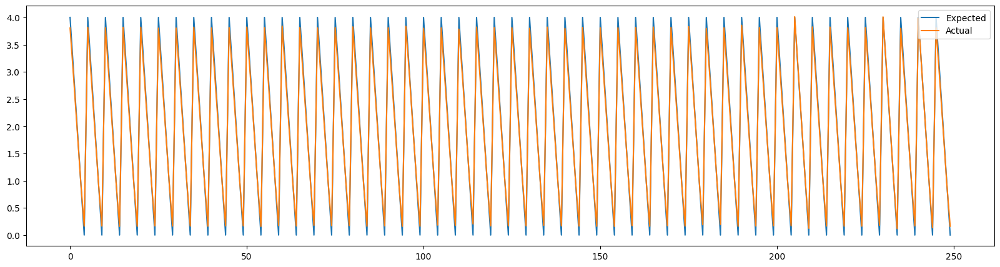

Streaming output truncated to the last 5000 lines.
  [0.07344401]]

 [[3.8876357 ]
  [2.6296449 ]
  [1.8363299 ]
  [1.0096278 ]
  [0.2355631 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.8594103 ]
  [2.8178458 ]
  [1.8847182 ]
  [0.9800362 ]
  [0.03151172]]

 [[3.8125885 ]
  [2.7975073 ]
  [1.8772651 ]
  [0.9651854 ]
  [0.04759157]]

 [[3.8287914 ]
  [2.7973769 ]
  [1.8734045 ]
  [0.95093936]
  [0.03782648]]

 ...

 [[3.8220503 ]
  [2.803203  ]
  [1.881112  ]
  [0.9703874 ]
  [0.04251909]]

 [[3.7572505 ]
  [2.7505157 ]
  [1.7660724 ]
  [0.94490063]
  [0.07312703]]

 [[3.887278  ]
  [2.629317  ]
  [1.8362572 ]
  [1.0096955 ]
  [0.23590428]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.8589215 ]
  [2.8175774 ]
  [1.8846133 ]
  [0.9800803 ]
  [0.03172338]]

 [[3.8121436 ]
  [2.7972782 ]
  [1.8771739 ]
  [0.96522105]
  [0.04779315]]

 [[3.82835   ]
  [2.797066  ]
  [1.8731973 ]
  [0.9508963 ]
  [0.03804189]]

 ...

 [[3.821

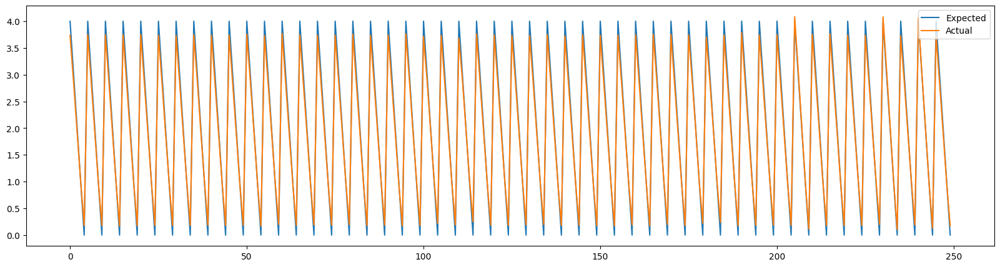

Streaming output truncated to the last 5000 lines.
  [0.10340816]]

 [[3.7931993 ]
  [2.5713034 ]
  [1.8106678 ]
  [1.0219705 ]
  [0.2851457 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.7575057 ]
  [2.7629466 ]
  [1.8620224 ]
  [0.98755836]
  [0.07571548]]

 [[3.721522  ]
  [2.7523005 ]
  [1.8580711 ]
  [0.97446114]
  [0.09047592]]

 [[3.7870884 ]
  [2.667934  ]
  [1.7984617 ]
  [0.97476673]
  [0.20959872]]

 ...

 [[3.7273645 ]
  [2.7279491 ]
  [1.829973  ]
  [0.9685233 ]
  [0.10776848]]

 [[3.6812935 ]
  [2.7083902 ]
  [1.7492776 ]
  [0.946126  ]
  [0.10394108]]

 [[3.792678  ]
  [2.571023  ]
  [1.8105304 ]
  [1.0220351 ]
  [0.28536522]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.7569685 ]
  [2.762652  ]
  [1.8618877 ]
  [0.98758537]
  [0.0759632 ]]

 [[3.721009  ]
  [2.752046  ]
  [1.8579645 ]
  [0.9744934 ]
  [0.09070045]]

 [[3.7869263 ]
  [2.6672144 ]
  [1.7986677 ]
  [0.97510266]
  [0.21082842]]

 ...

 [[3.726

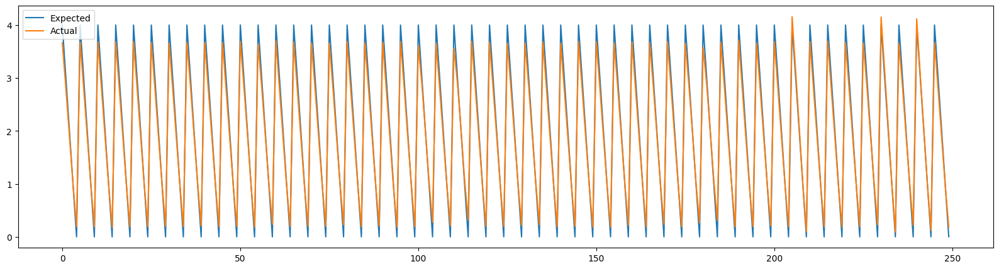

Streaming output truncated to the last 5000 lines.
  [0.11119431]]

 [[3.687911  ]
  [2.5188546 ]
  [1.7837813 ]
  [1.0348992 ]
  [0.32787335]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.64755   ]
  [2.6667085 ]
  [1.8004181 ]
  [0.99130714]
  [0.1859498 ]]

 [[3.6241472 ]
  [2.704696  ]
  [1.8351835 ]
  [0.98281944]
  [0.13531822]]

 [[3.6853397 ]
  [2.5897267 ]
  [1.8100808 ]
  [1.0120468 ]
  [0.3250454 ]]

 ...

 [[3.6485212 ]
  [2.5974884 ]
  [1.7964447 ]
  [1.0166407 ]
  [0.3178581 ]]

 [[3.551111  ]
  [2.6470551 ]
  [1.7429886 ]
  [0.9515297 ]
  [0.11142212]]

 [[3.6873794 ]
  [2.518534  ]
  [1.7836689 ]
  [1.0349379 ]
  [0.32805097]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.6470048 ]
  [2.6659608 ]
  [1.7999649 ]
  [0.99149096]
  [0.1871556 ]]

 [[3.623674  ]
  [2.704473  ]
  [1.835061  ]
  [0.9828706 ]
  [0.13555098]]

 [[3.6847205 ]
  [2.589418  ]
  [1.8100401 ]
  [1.0121659 ]
  [0.32537884]]

 ...

 [[3.648

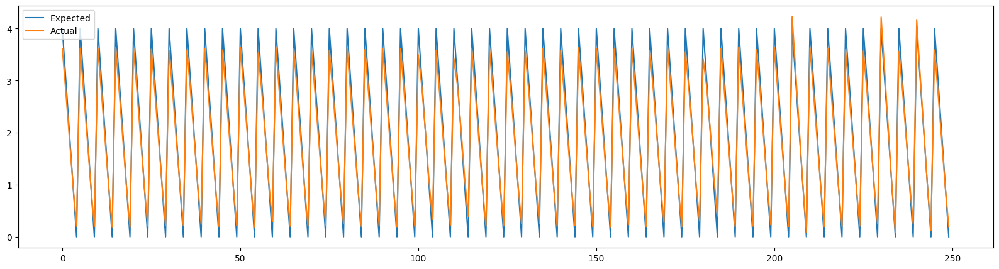

Streaming output truncated to the last 5000 lines.
  [0.16586679]]

 [[3.5760746 ]
  [2.468243  ]
  [1.7591562 ]
  [1.0492498 ]
  [0.37129217]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.5582922 ]
  [2.587779  ]
  [1.767134  ]
  [1.0153377 ]
  [0.30443388]]

 [[3.5432456 ]
  [2.6177924 ]
  [1.7583542 ]
  [0.9878736 ]
  [0.22429353]]

 [[3.5883605 ]
  [2.5440102 ]
  [1.7961779 ]
  [1.0283135 ]
  [0.37423253]]

 ...

 [[3.5541725 ]
  [2.544948  ]
  [1.7912297 ]
  [1.0382934 ]
  [0.38048166]]

 [[3.4308553 ]
  [2.5957546 ]
  [1.7079686 ]
  [0.95508224]
  [0.16605717]]

 [[3.5755014 ]
  [2.4679644 ]
  [1.7590568 ]
  [1.0493191 ]
  [0.3714884 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.5579228 ]
  [2.5875568 ]
  [1.7670896 ]
  [1.0153993 ]
  [0.30467725]]

 [[3.5428374 ]
  [2.617104  ]
  [1.7577419 ]
  [0.9880556 ]
  [0.22530735]]

 [[3.5879395 ]
  [2.5437553 ]
  [1.7960694 ]
  [1.0283473 ]
  [0.37444282]]

 ...

 [[3.553

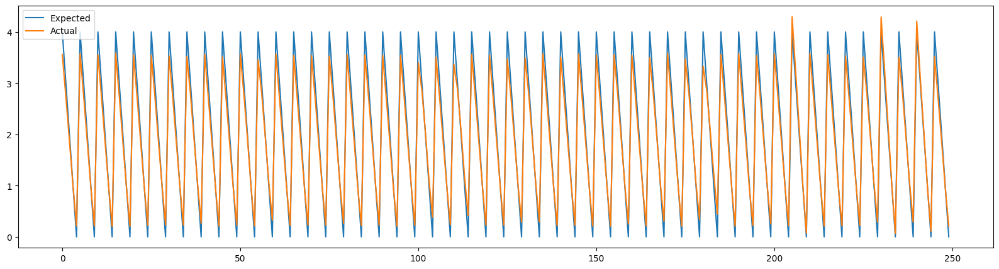

(466, 5, 1)


In [ ]:
advX = []
attack_prediction = []
rmse_attack = []
for i in range(len(epsilon)):
  advX.append(bim_attack(saved_model, epsilon[i], X_test, Y_test, 0.01))
  attack_prediction.append(model(advX[i],training=False))
  # plot(test_y, attack_prediction[i])
  fig = plt.figure()
  expected = np.concatenate(Y_test[0: 50]).ravel()
  actual = np.concatenate(attack_prediction[i][0: 50]).ravel()
  xc  = range(len(expected))
  plt.plot(xc, expected, label='Expected')
  plt.plot(xc, actual, label='Actual')
  fig.set_size_inches(20, 5)
  plt.legend()
  plt.show()
  rmse_attack.append(rmse_metric(Y_test, attack_prediction[i]))

In [ ]:
rmse_attack

[0.12754716, 0.15994138, 0.19691421, 0.23483266, 0.2691211]

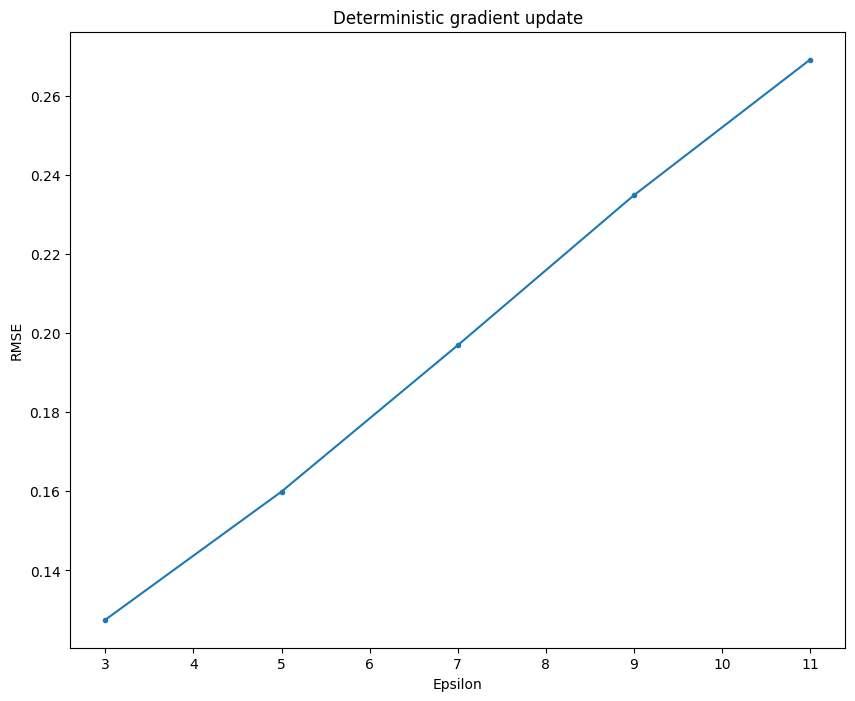

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.ylabel('RMSE')
plt.xlabel('Epsilon')
plt.title("Deterministic gradient update")
plt.plot(epsilon, rmse_attack, marker=".")
plt.show()

# Select random values within a specified range for epsilon

In [ ]:
import pandas as pd

import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

from tensorflow import keras
from keras.models import Sequential, save_model
from keras.layers import LSTM, Dense, Dropout, RepeatVector, TimeDistributed

In [ ]:
ddf = pd.read_excel("hdd_dataset_5_day.xlsx")

In [ ]:
ddf.shape

(23300, 32)

In [ ]:
ddf.columns[6:-1]

Index(['failure', 'smart_1_raw', 'smart_3_raw', 'smart_4_raw', 'smart_5_raw',
       'smart_7_raw', 'smart_9_raw', 'smart_10_raw', 'smart_12_raw',
       'smart_183_raw', 'smart_184_raw', 'smart_187_raw', 'smart_188_raw',
       'smart_189_raw', 'smart_190_raw', 'smart_191_raw', 'smart_192_raw',
       'smart_193_raw', 'smart_194_raw', 'smart_197_raw', 'smart_198_raw',
       'smart_199_raw', 'smart_240_raw', 'smart_241_raw', 'smart_242_raw'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler((0, 255))

print(ddf[ddf.isnull().any(axis=1)])

cols = ddf.columns[6:-1]

number_of_rows = ddf.shape[0]
time_steps = 5
batch_size = 30
number_of_columns = len(cols)
X = ddf[cols].to_numpy()
Y = ddf[['rul']].to_numpy()

print(X.shape)
print(Y.shape)

X_svr = X.copy()
Y_svr = Y.copy()

# transform data
X = scaler.fit_transform(X)

X = X.reshape((int(number_of_rows/time_steps), time_steps, number_of_columns))
Y = Y.reshape((int(Y.shape[0]/time_steps), time_steps, 1))
# Y = Y[:, -1, :].reshape(-1, 1, 1)

print(Y.shape)

SEED = 50
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.1, random_state=SEED, shuffle=False)
# X_test, X_val, Y_test, Y_val = train_test_split(X_rem, Y_rem, test_size=0.5)

Empty DataFrame
Columns: [Unnamed: 0, index, date, serial_number, model, capacity_bytes, failure, smart_1_raw, smart_3_raw, smart_4_raw, smart_5_raw, smart_7_raw, smart_9_raw, smart_10_raw, smart_12_raw, smart_183_raw, smart_184_raw, smart_187_raw, smart_188_raw, smart_189_raw, smart_190_raw, smart_191_raw, smart_192_raw, smart_193_raw, smart_194_raw, smart_197_raw, smart_198_raw, smart_199_raw, smart_240_raw, smart_241_raw, smart_242_raw, rul]
Index: []

[0 rows x 32 columns]
(23300, 25)
(23300, 1)
(4660, 5, 1)


In [ ]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(4194, 5, 25)
(466, 5, 25)
(4194, 5, 1)
(466, 5, 1)


In [ ]:
from tensorflow import keras
from keras.models import Sequential, save_model
from keras.layers import LSTM, Dense, Dropout, Bidirectional

def create_model_as_m1(t_steps, n_columns):
    m1 = Sequential()
    m1.add(LSTM(100, activation='relu', input_shape=(t_steps, n_columns)))
    m1.add(RepeatVector(t_steps))
    m1.add(LSTM(100, activation='relu', return_sequences=True))
    m1.add(Dropout(0.10))
    m1.add(TimeDistributed(Dense(1)))
    print(m1.summary())

    m1.compile(optimizer='adam', loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

    return m1

In [ ]:
import tensorflow as tf
# Instantiate an optimizer.
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
# Prepare the metrics.
train_acc_metric = keras.metrics.RootMeanSquaredError()
val_acc_metric = keras.metrics.RootMeanSquaredError()

In [ ]:
time_steps = X_train.shape[1]
number_of_rows = X_train.shape[0]
number_of_columns = X_train.shape[2]
model = create_model_as_m1(time_steps, number_of_columns)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               50400     
                                                                 
 repeat_vector (RepeatVecto  (None, 5, 100)            0         
 r)                                                              
                                                                 
 lstm_1 (LSTM)               (None, 5, 100)            80400     
                                                                 
 dropout (Dropout)           (None, 5, 100)            0         
                                                                 
 time_distributed (TimeDist  (None, 5, 1)              101       
 ributed)                                                        
                                                                 
Total params: 130901 (511.33 KB)
Trainable params: 13090

In [ ]:
def perturb_weights(gradient):
  import numpy as np
  import random
  g_perturbed = []
  i=1
  x = random.uniform(3,11)
  I = min(4 + (x/0.01), 1.25 * (x/0.01))
  while(i<=I):
    gradient_perturbed = []
    epsilon = random.uniform(3,11)
    final_perturbed_gradient = []
    for j in range(len(gradient)):
      gradient_perturbed.append(gradient[j] + (0.1 * np.sign(gradient[j])))

    for k in range(len(gradient_perturbed)):
      final_perturbed_gradient.append(np.minimum(gradient_perturbed[k]+epsilon, np.maximum(gradient_perturbed[k]-epsilon, gradient[k])))

    gradient = final_perturbed_gradient
    i+=1
  return gradient

In [ ]:
def rmse_metric(predictions, targets):
    # Compute squared differences
    squared_diff = (predictions - targets) ** 2
    print(squared_diff.shape)
    # Calculate mean of squared differences
    mean_squared_diff = np.mean(squared_diff)
    # Take the square root to get RMSE
    rmse_value = np.sqrt(mean_squared_diff)
    return rmse_value

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping
from sklearn.model_selection import TimeSeriesSplit
import numpy as np
from sklearn.metrics import mean_squared_error

def robust_model(model, epochs, X_train, Y_train, optimizer, train_acc_metric, val_acc_metric): #=> gradient

  # epochs = 20
  # data = train_X
  # label = train_y

  tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=None)
  print(tscv)

  rmse_train = []
  rmse_val = []

  for i, (train_index, test_index) in enumerate(tscv.split(X_train)):
    print(f"Fold {i}:")
    print(f"  Train: index={train_index}")
    print(f"  Test:  index={test_index}")
    train_X = X_train[:train_index[-1]]
    train_y = Y_train[:train_index[-1]]
    print(train_X.shape)
    val_X = X_train[test_index[-1]:]
    val_y = Y_train[test_index[-1]:]
    print(Y_train.shape)

    for epoch in range(epochs):
        # print("\nStart of epoch %d" % (epoch,))
        with tf.GradientTape() as tape:
          # tape.watch(data)
          '''  FIRST ROUND OF LPAT:
          1. Perform feedforward process to compute the output of the neural network '''
          predictions = model(train_X, training=True)
          # print("Predictions", predictions)
          loss = tf.keras.losses.MSE(train_y, predictions)
        ''' 2. Perform backpropagation to update parameters (weights) and store gradient in accumulation layers'''
        gradient = tape.gradient(loss, model.trainable_weights)
        # gradient = np.array(gradient)
        # print(gradient.shape)
        optimizer.apply_gradients(zip(gradient, model.trainable_weights))
        # data += gradient[len(gradient)-1]
        ''' 3. Perform layerwise perturbation process based on gradients to each layer, and perform feedforward process to compute new output of the neural network'''
        gradient = perturb_weights(gradient)
        with tf.GradientTape() as tape:
          # tape.watch(data)
          predictions = model(train_X, training=True)
          # print("Predictions", predictions)
          loss = tf.keras.losses.MSE(train_y, predictions)
        ''' Finally, it performs backpropagation again to update parameters of all network layers'''
        gradient = tape.gradient(loss, model.trainable_weights)
        optimizer.apply_gradients(zip(gradient, model.trainable_weights))

        #Update training metric.
        train_acc_metric.update_state(train_y, predictions)

        # data += gradient[len(gradient)-1]

        # with tf.GradientTape() as tape:
        #   # tape.watch(data)
        #   predictions = model(data)
        #   loss = tf.keras.losses.MSE(label, predictions)
        # gradient = tape.gradient(loss, model.trainable_weights)
        # gradient = np.array(gradient)
        # optimizer.apply_gradients(zip(gradient, model.trainable_weights))
        # data += gradient[len(gradient)-1]

        # Log every 10 epochs.
        if epoch % 10 == 0:
            print("Loss", np.mean(loss))
        # Display metrics at the end of each epoch.
        train_acc = train_acc_metric.result()
        print("Training RMSE over epoch: %.4f" % (float(train_acc),))

        # Reset training metrics at the end of each epoch
        train_acc_metric.reset_states()

        # Run a validation loop at the end of each epoch.
        val_logits = model(val_X, training=False)
        # Update val metrics
        val_acc_metric.update_state(val_y, val_logits)
        val_acc = val_acc_metric.result()
        val_acc_metric.reset_states()
        print("Validation RMSE: %.4f" % (float(val_acc),))

    rmse_train.append(rmse_metric(train_y, predictions))

  return rmse_train, predictions

In [ ]:
rmse_train, train_predictions = robust_model(model, 50, X_train, Y_train, optimizer, train_acc_metric, val_acc_metric)

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=None)
Fold 0:
  Train: index=[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222

In [ ]:
rmse_train

[0.5194264,
 0.46888003,
 0.3519025,
 0.3454013,
 0.31883517,
 0.3086317,
 0.28867927,
 0.2741073,
 0.27829555,
 0.34407386]

In [ ]:
print("Train RMSE", np.mean(rmse_train))

Train RMSE 0.3498233


In [ ]:
train_predictions.shape

TensorShape([3812, 5, 1])

In [ ]:
Y_train.shape

(4194, 5, 1)

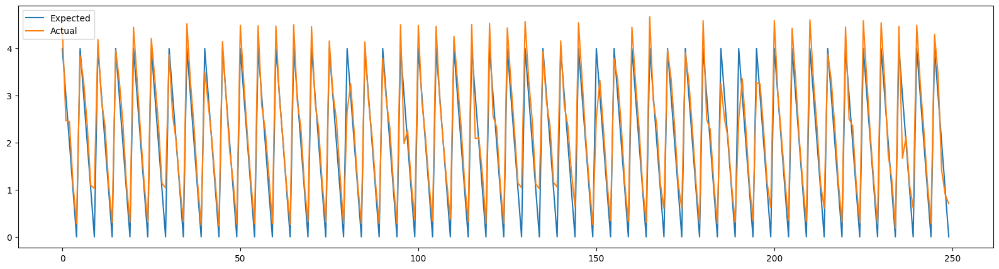

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_train[0: 50]).ravel()
actual = np.concatenate(train_predictions[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

In [ ]:
with tf.GradientTape() as tape:
  # tape.watch(data)
  predictions = model(X_test, training=False)
  # print("Predictions", predictions)
  loss = tf.keras.losses.MSE(Y_test, predictions)
  print(np.mean(loss))

0.05356671


In [ ]:
p = model(X_test,training=False)

In [ ]:
predictions.shape

TensorShape([466, 5, 1])

In [ ]:
Y_test.shape

(466, 5, 1)

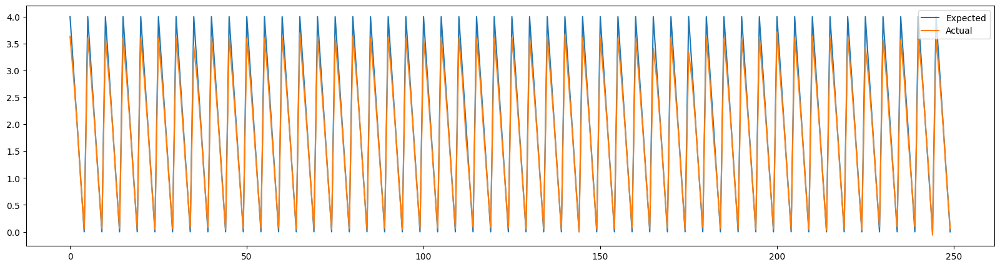

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(predictions[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

In [ ]:
rmse_test = rmse_metric(Y_test, p)

(466, 5, 1)


In [ ]:
rmse_test

0.23144484

### Performance of robust model on dataset poisoned with individual epsilon values

In [ ]:
def bim_attack(model, epsilon, data, label, alpha):
  import numpy as np
  import tensorflow as tf
  data = tf.convert_to_tensor(data)
  i = 1
  I = min(4 + epsilon/alpha, 1.25 * epsilon/alpha)
  # I = 20
  print(I)
  # epsilon_scaled = np.full((data.shape[0], data.shape[1], data.shape[2]), epsilon)
  # epsilon_scaled = tf.convert_to_tensor(epsilon_scaled)
  # print(epsilon_scaled.shape)
  while(i<=I):
    with tf.GradientTape() as tape:
      tape.watch(data)
      predictions = model(data)
      print("Predictions", predictions)
      loss = tf.keras.losses.MSE(label, predictions)
    gradient = tape.gradient(loss, data)
    print(gradient.shape)
    advX = data + (alpha * np.sign(gradient))
    advX = tf.math.minimum(data + epsilon, tf.math.maximum(data - epsilon, advX))
    data = advX
    # advX = np.where(advX > data+epsilon, data+epsilon, advX)
    # advX = np.where(advX < data-epsilon, data-epsilon, advX)
    i+=1
  return advX

In [ ]:
import tensorflow as tf
import keras
from keras.models import load_model
saved_model = load_model('10_fold_model.34-0.00.h5')

In [ ]:
saved_model.compile(optimizer='adam', loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

In [ ]:
epsilon = [3, 5, 7, 9, 11]

Streaming output truncated to the last 5000 lines.
  [ 3.0373037e-02]]

 [[ 3.9210923e+00]
  [ 2.7842033e+00]
  [ 1.8413777e+00]
  [ 9.5780432e-01]
  [ 6.6612124e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 3.9549654e+00]
  [ 2.8714273e+00]
  [ 1.9053940e+00]
  [ 9.6941483e-01]
  [-1.2342215e-02]]

 [[ 3.9034493e+00]
  [ 2.8450375e+00]
  [ 1.8967354e+00]
  [ 9.5702219e-01]
  [ 5.3583384e-03]]

 [[ 3.9217753e+00]
  [ 2.8519943e+00]
  [ 1.9003832e+00]
  [ 9.4965011e-01]
  [-3.6725998e-03]]

 ...

 [[ 3.9091585e+00]
  [ 2.8510685e+00]
  [ 1.9015155e+00]
  [ 9.6126813e-01]
  [-4.8071146e-04]]

 [[ 3.8924263e+00]
  [ 2.8012540e+00]
  [ 1.8175068e+00]
  [ 9.4125944e-01]
  [ 3.0831635e-02]]

 [[ 3.9211917e+00]
  [ 2.7831607e+00]
  [ 1.8407811e+00]
  [ 9.5809072e-01]
  [ 6.7773700e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 3.9544966e+00]
  [ 2.8711596e+00]
  [ 1.9052908e+00]
  [ 9.6947056e-01]
  [-1.2128651e-02]]

 [[ 

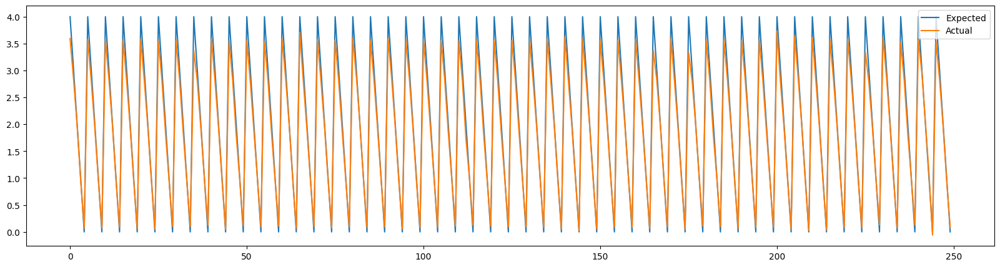

Streaming output truncated to the last 5000 lines.
  [0.07344401]]

 [[3.8876357 ]
  [2.6296449 ]
  [1.8363299 ]
  [1.0096278 ]
  [0.2355631 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.8594103 ]
  [2.8178458 ]
  [1.8847182 ]
  [0.9800362 ]
  [0.03151172]]

 [[3.8125885 ]
  [2.7975073 ]
  [1.8772651 ]
  [0.9651854 ]
  [0.04759157]]

 [[3.8287914 ]
  [2.7973769 ]
  [1.8734045 ]
  [0.95093936]
  [0.03782648]]

 ...

 [[3.8220503 ]
  [2.803203  ]
  [1.881112  ]
  [0.9703874 ]
  [0.04251909]]

 [[3.7572505 ]
  [2.7505157 ]
  [1.7660724 ]
  [0.94490063]
  [0.07312703]]

 [[3.887278  ]
  [2.629317  ]
  [1.8362572 ]
  [1.0096955 ]
  [0.23590428]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.8589215 ]
  [2.8175774 ]
  [1.8846133 ]
  [0.9800803 ]
  [0.03172338]]

 [[3.8121436 ]
  [2.7972782 ]
  [1.8771739 ]
  [0.96522105]
  [0.04779315]]

 [[3.82835   ]
  [2.797066  ]
  [1.8731973 ]
  [0.9508963 ]
  [0.03804189]]

 ...

 [[3.821

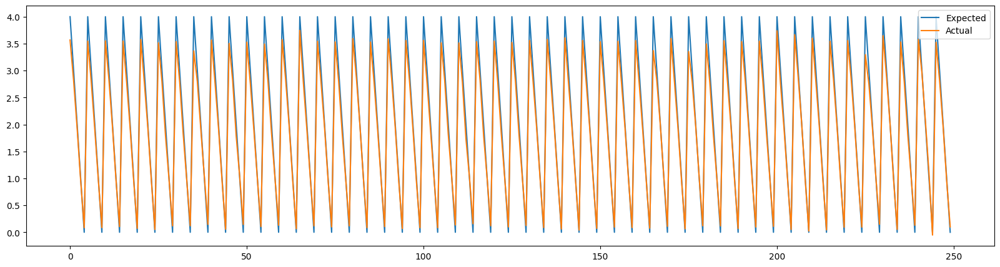

Streaming output truncated to the last 5000 lines.
  [0.10340816]]

 [[3.7931993 ]
  [2.5713034 ]
  [1.8106678 ]
  [1.0219705 ]
  [0.2851457 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.7575057 ]
  [2.7629466 ]
  [1.8620224 ]
  [0.98755836]
  [0.07571548]]

 [[3.721522  ]
  [2.7523005 ]
  [1.8580711 ]
  [0.97446114]
  [0.09047592]]

 [[3.7870884 ]
  [2.667934  ]
  [1.7984617 ]
  [0.97476673]
  [0.20959872]]

 ...

 [[3.7273645 ]
  [2.7279491 ]
  [1.829973  ]
  [0.9685233 ]
  [0.10776848]]

 [[3.6812935 ]
  [2.7083902 ]
  [1.7492776 ]
  [0.946126  ]
  [0.10394108]]

 [[3.792678  ]
  [2.571023  ]
  [1.8105304 ]
  [1.0220351 ]
  [0.28536522]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.7569685 ]
  [2.762652  ]
  [1.8618877 ]
  [0.98758537]
  [0.0759632 ]]

 [[3.721009  ]
  [2.752046  ]
  [1.8579645 ]
  [0.9744934 ]
  [0.09070045]]

 [[3.7869263 ]
  [2.6672144 ]
  [1.7986677 ]
  [0.97510266]
  [0.21082842]]

 ...

 [[3.726

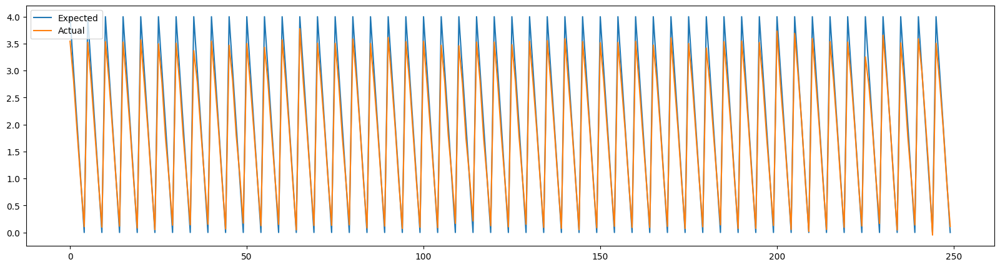

Streaming output truncated to the last 5000 lines.
  [0.11119431]]

 [[3.687911  ]
  [2.5188546 ]
  [1.7837813 ]
  [1.0348992 ]
  [0.32787335]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.64755   ]
  [2.6667085 ]
  [1.8004181 ]
  [0.99130714]
  [0.1859498 ]]

 [[3.6241472 ]
  [2.704696  ]
  [1.8351835 ]
  [0.98281944]
  [0.13531822]]

 [[3.6853397 ]
  [2.5897267 ]
  [1.8100808 ]
  [1.0120468 ]
  [0.3250454 ]]

 ...

 [[3.6485212 ]
  [2.5974884 ]
  [1.7964447 ]
  [1.0166407 ]
  [0.3178581 ]]

 [[3.551111  ]
  [2.6470551 ]
  [1.7429886 ]
  [0.9515297 ]
  [0.11142212]]

 [[3.6873794 ]
  [2.518534  ]
  [1.7836689 ]
  [1.0349379 ]
  [0.32805097]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.6470048 ]
  [2.6659608 ]
  [1.7999649 ]
  [0.99149096]
  [0.1871556 ]]

 [[3.623674  ]
  [2.704473  ]
  [1.835061  ]
  [0.9828706 ]
  [0.13555098]]

 [[3.6847205 ]
  [2.589418  ]
  [1.8100401 ]
  [1.0121659 ]
  [0.32537884]]

 ...

 [[3.648

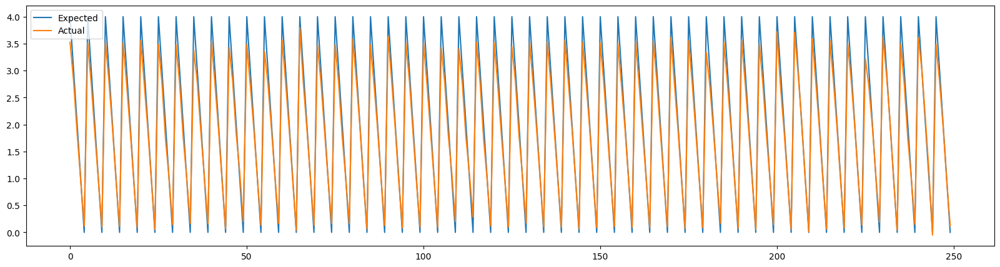

Streaming output truncated to the last 5000 lines.
  [0.16586679]]

 [[3.5760746 ]
  [2.468243  ]
  [1.7591562 ]
  [1.0492498 ]
  [0.37129217]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.5582922 ]
  [2.587779  ]
  [1.767134  ]
  [1.0153377 ]
  [0.30443388]]

 [[3.5432456 ]
  [2.6177924 ]
  [1.7583542 ]
  [0.9878736 ]
  [0.22429353]]

 [[3.5883605 ]
  [2.5440102 ]
  [1.7961779 ]
  [1.0283135 ]
  [0.37423253]]

 ...

 [[3.5541725 ]
  [2.544948  ]
  [1.7912297 ]
  [1.0382934 ]
  [0.38048166]]

 [[3.4308553 ]
  [2.5957546 ]
  [1.7079686 ]
  [0.95508224]
  [0.16605717]]

 [[3.5755014 ]
  [2.4679644 ]
  [1.7590568 ]
  [1.0493191 ]
  [0.3714884 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.5579228 ]
  [2.5875568 ]
  [1.7670896 ]
  [1.0153993 ]
  [0.30467725]]

 [[3.5428374 ]
  [2.617104  ]
  [1.7577419 ]
  [0.9880556 ]
  [0.22530735]]

 [[3.5879395 ]
  [2.5437553 ]
  [1.7960694 ]
  [1.0283473 ]
  [0.37444282]]

 ...

 [[3.553

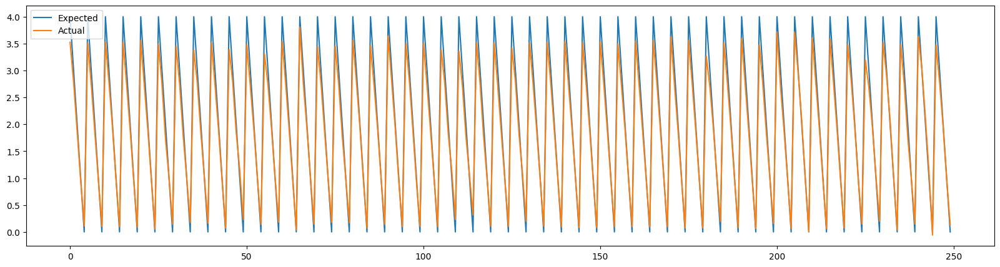

(466, 5, 1)


In [ ]:
advX = []
attack_prediction = []
rmse_attack = []
for i in range(len(epsilon)):
  advX.append(bim_attack(saved_model, epsilon[i], X_test, Y_test, 0.01))
  attack_prediction.append(model(advX[i],training=False))
  # plot(test_y, attack_prediction[i])
  fig = plt.figure()
  expected = np.concatenate(Y_test[0: 50]).ravel()
  actual = np.concatenate(attack_prediction[i][0: 50]).ravel()
  xc  = range(len(expected))
  plt.plot(xc, expected, label='Expected')
  plt.plot(xc, actual, label='Actual')
  fig.set_size_inches(20, 5)
  plt.legend()
  plt.show()
  rmse_attack.append(rmse_metric(Y_test, attack_prediction[i]))

In [ ]:
rmse_attack

[0.2514788, 0.26142916, 0.2694167, 0.2750692, 0.278956]

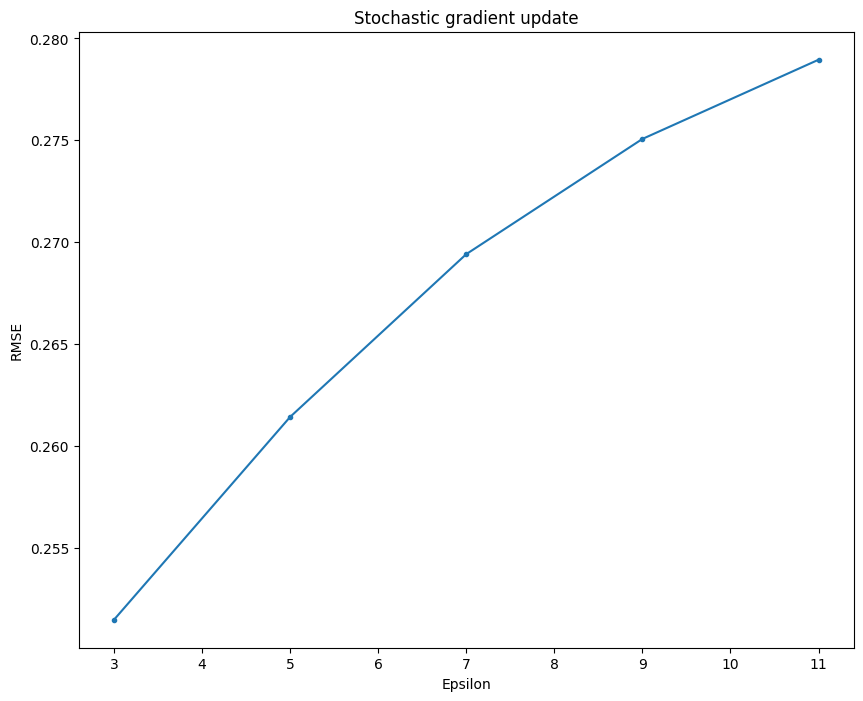

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.ylabel('RMSE')
plt.xlabel('Epsilon')
plt.title("Stochastic gradient update")
plt.plot(epsilon, rmse_attack, marker=".")
plt.show()

# Select random values within a specified range for epsilon - Method 2

In [ ]:
import pandas as pd

import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

from tensorflow import keras
from keras.models import Sequential, save_model
from keras.layers import LSTM, Dense, Dropout, RepeatVector, TimeDistributed

In [ ]:
ddf = pd.read_excel("hdd_dataset_5_day.xlsx")

In [ ]:
ddf.shape

(23300, 32)

In [ ]:
ddf.columns[6:-1]

Index(['failure', 'smart_1_raw', 'smart_3_raw', 'smart_4_raw', 'smart_5_raw',
       'smart_7_raw', 'smart_9_raw', 'smart_10_raw', 'smart_12_raw',
       'smart_183_raw', 'smart_184_raw', 'smart_187_raw', 'smart_188_raw',
       'smart_189_raw', 'smart_190_raw', 'smart_191_raw', 'smart_192_raw',
       'smart_193_raw', 'smart_194_raw', 'smart_197_raw', 'smart_198_raw',
       'smart_199_raw', 'smart_240_raw', 'smart_241_raw', 'smart_242_raw'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler((0, 255))

print(ddf[ddf.isnull().any(axis=1)])

cols = ddf.columns[6:-1]

number_of_rows = ddf.shape[0]
time_steps = 5
batch_size = 30
number_of_columns = len(cols)
X = ddf[cols].to_numpy()
Y = ddf[['rul']].to_numpy()

print(X.shape)
print(Y.shape)

X_svr = X.copy()
Y_svr = Y.copy()

# transform data
X = scaler.fit_transform(X)

X = X.reshape((int(number_of_rows/time_steps), time_steps, number_of_columns))
Y = Y.reshape((int(Y.shape[0]/time_steps), time_steps, 1))
# Y = Y[:, -1, :].reshape(-1, 1, 1)

print(Y.shape)

SEED = 50
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.1, random_state=SEED, shuffle=False)
# X_test, X_val, Y_test, Y_val = train_test_split(X_rem, Y_rem, test_size=0.5)

Empty DataFrame
Columns: [Unnamed: 0, index, date, serial_number, model, capacity_bytes, failure, smart_1_raw, smart_3_raw, smart_4_raw, smart_5_raw, smart_7_raw, smart_9_raw, smart_10_raw, smart_12_raw, smart_183_raw, smart_184_raw, smart_187_raw, smart_188_raw, smart_189_raw, smart_190_raw, smart_191_raw, smart_192_raw, smart_193_raw, smart_194_raw, smart_197_raw, smart_198_raw, smart_199_raw, smart_240_raw, smart_241_raw, smart_242_raw, rul]
Index: []

[0 rows x 32 columns]
(23300, 25)
(23300, 1)
(4660, 5, 1)


In [ ]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(4194, 5, 25)
(466, 5, 25)
(4194, 5, 1)
(466, 5, 1)


In [ ]:
from tensorflow import keras
from keras.models import Sequential, save_model
from keras.layers import LSTM, Dense, Dropout, Bidirectional

def create_model_as_m1(t_steps, n_columns):
    m1 = Sequential()
    m1.add(LSTM(100, activation='relu', input_shape=(t_steps, n_columns)))
    m1.add(RepeatVector(t_steps))
    m1.add(LSTM(100, activation='relu', return_sequences=True))
    m1.add(Dropout(0.10))
    m1.add(TimeDistributed(Dense(1)))
    print(m1.summary())

    m1.compile(optimizer='adam', loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

    return m1

In [ ]:
import tensorflow as tf
# Instantiate an optimizer.
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
# Prepare the metrics.
train_acc_metric = keras.metrics.RootMeanSquaredError()
val_acc_metric = keras.metrics.RootMeanSquaredError()

In [ ]:
time_steps = X_train.shape[1]
number_of_rows = X_train.shape[0]
number_of_columns = X_train.shape[2]
model = create_model_as_m1(time_steps, number_of_columns)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               50400     
                                                                 
 repeat_vector (RepeatVecto  (None, 5, 100)            0         
 r)                                                              
                                                                 
 lstm_1 (LSTM)               (None, 5, 100)            80400     
                                                                 
 dropout (Dropout)           (None, 5, 100)            0         
                                                                 
 time_distributed (TimeDist  (None, 5, 1)              101       
 ributed)                                                        
                                                                 
Total params: 130901 (511.33 KB)
Trainable params: 13090

In [ ]:
def perturb_weights(gradient):
  import numpy as np
  import random
  g_perturbed = []
  i=1
  x = random.uniform(3,11)
  epsilon = random.uniform(3,11)
  I = min(4 + (x/0.01), 1.25 * (x/0.01))
  while(i<=I):
    gradient_perturbed = []
    final_perturbed_gradient = []
    for j in range(len(gradient)):
      gradient_perturbed.append(gradient[j] + (0.1 * np.sign(gradient[j])))

    for k in range(len(gradient_perturbed)):
      final_perturbed_gradient.append(np.minimum(gradient_perturbed[k]+epsilon, np.maximum(gradient_perturbed[k]-epsilon, gradient[k])))

    gradient = final_perturbed_gradient
    i+=1
  return gradient

In [ ]:
def rmse_metric(predictions, targets):
    # Compute squared differences
    squared_diff = (predictions - targets) ** 2
    print(squared_diff.shape)
    # Calculate mean of squared differences
    mean_squared_diff = np.mean(squared_diff)
    # Take the square root to get RMSE
    rmse_value = np.sqrt(mean_squared_diff)
    return rmse_value

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping
from sklearn.model_selection import TimeSeriesSplit
import numpy as np
from sklearn.metrics import mean_squared_error

def robust_model(model, epochs, X_train, Y_train, optimizer, train_acc_metric, val_acc_metric): #=> gradient

  # epochs = 20
  # data = train_X
  # label = train_y

  tscv = TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=None)
  print(tscv)

  rmse_train = []
  rmse_val = []

  for i, (train_index, test_index) in enumerate(tscv.split(X_train)):
    print(f"Fold {i}:")
    print(f"  Train: index={train_index}")
    print(f"  Test:  index={test_index}")
    train_X = X_train[:train_index[-1]]
    train_y = Y_train[:train_index[-1]]
    print(train_X.shape)
    val_X = X_train[test_index[-1]:]
    val_y = Y_train[test_index[-1]:]
    print(Y_train.shape)

    for epoch in range(epochs):
        # print("\nStart of epoch %d" % (epoch,))
        with tf.GradientTape() as tape:
          # tape.watch(data)
          '''  FIRST ROUND OF LPAT:
          1. Perform feedforward process to compute the output of the neural network '''
          predictions = model(train_X, training=True)
          # print("Predictions", predictions)
          loss = tf.keras.losses.MSE(train_y, predictions)
        ''' 2. Perform backpropagation to update parameters (weights) and store gradient in accumulation layers'''
        gradient = tape.gradient(loss, model.trainable_weights)
        # gradient = np.array(gradient)
        # print(gradient.shape)
        optimizer.apply_gradients(zip(gradient, model.trainable_weights))
        # data += gradient[len(gradient)-1]
        ''' 3. Perform layerwise perturbation process based on gradients to each layer, and perform feedforward process to compute new output of the neural network'''
        gradient = perturb_weights(gradient)
        with tf.GradientTape() as tape:
          # tape.watch(data)
          predictions = model(train_X, training=True)
          # print("Predictions", predictions)
          loss = tf.keras.losses.MSE(train_y, predictions)
        ''' Finally, it performs backpropagation again to update parameters of all network layers'''
        gradient = tape.gradient(loss, model.trainable_weights)
        optimizer.apply_gradients(zip(gradient, model.trainable_weights))

        #Update training metric.
        train_acc_metric.update_state(train_y, predictions)

        # data += gradient[len(gradient)-1]

        # with tf.GradientTape() as tape:
        #   # tape.watch(data)
        #   predictions = model(data)
        #   loss = tf.keras.losses.MSE(label, predictions)
        # gradient = tape.gradient(loss, model.trainable_weights)
        # gradient = np.array(gradient)
        # optimizer.apply_gradients(zip(gradient, model.trainable_weights))
        # data += gradient[len(gradient)-1]

        # Log every 10 epochs.
        if epoch % 10 == 0:
            print("Loss", np.mean(loss))
        # Display metrics at the end of each epoch.
        train_acc = train_acc_metric.result()
        print("Training RMSE over epoch: %.4f" % (float(train_acc),))

        # Reset training metrics at the end of each epoch
        train_acc_metric.reset_states()

        # Run a validation loop at the end of each epoch.
        val_logits = model(val_X, training=False)
        # Update val metrics
        val_acc_metric.update_state(val_y, val_logits)
        val_acc = val_acc_metric.result()
        val_acc_metric.reset_states()
        print("Validation RMSE: %.4f" % (float(val_acc),))

    rmse_train.append(rmse_metric(train_y, predictions))

  return rmse_train, predictions

In [ ]:
rmse_train, train_predictions = robust_model(model, 50, X_train, Y_train, optimizer, train_acc_metric, val_acc_metric)

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=None)
Fold 0:
  Train: index=[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222

In [ ]:
rmse_train

[0.42061204,
 0.36985263,
 0.3171232,
 0.28657594,
 0.27495396,
 0.26495677,
 0.25197032,
 0.24649167,
 0.21048379,
 0.20466994]

In [ ]:
print("Train RMSE", np.mean(rmse_train))

Train RMSE 0.28476903


In [ ]:
train_predictions.shape

TensorShape([3812, 5, 1])

In [ ]:
Y_train.shape

(4194, 5, 1)

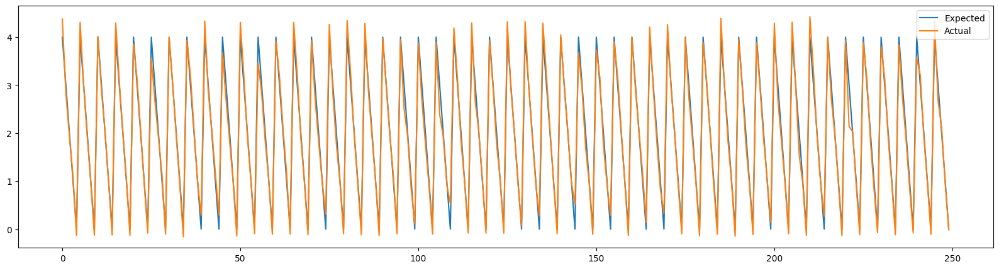

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_train[0: 50]).ravel()
actual = np.concatenate(train_predictions[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

In [ ]:
with tf.GradientTape() as tape:
  # tape.watch(data)
  predictions = model(X_test, training=False)
  # print("Predictions", predictions)
  loss = tf.keras.losses.MSE(Y_test, predictions)
  print(np.mean(loss))

0.0020742354


In [ ]:
p = model(X_test,training=False)

In [ ]:
predictions.shape

TensorShape([466, 5, 1])

In [ ]:
Y_test.shape

(466, 5, 1)

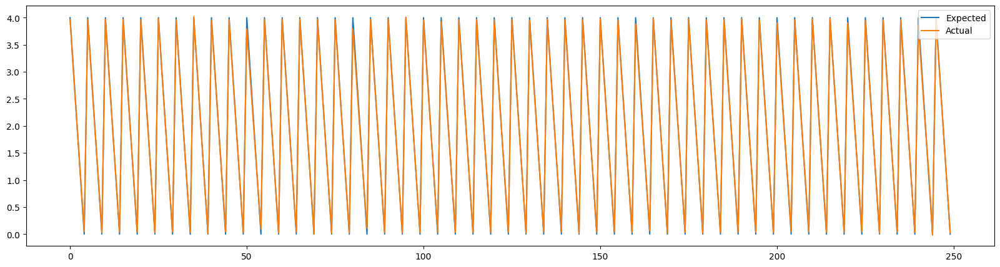

In [ ]:
fig = plt.figure()

expected = np.concatenate(Y_test[0: 50]).ravel()
actual = np.concatenate(predictions[0: 50]).ravel()
xc  = range(len(expected))
plt.plot(xc, expected, label='Expected')
plt.plot(xc, actual, label='Actual')
fig.set_size_inches(20, 5)
plt.legend()
plt.show()

In [ ]:
rmse_test = rmse_metric(Y_test, p)

(466, 5, 1)


In [ ]:
rmse_test

0.045543775

### Performance of robust model on dataset poisoned with individual epsilon values

In [ ]:
def bim_attack(model, epsilon, data, label, alpha):
  import numpy as np
  import tensorflow as tf
  data = tf.convert_to_tensor(data)
  i = 1
  I = min(4 + epsilon/alpha, 1.25 * epsilon/alpha)
  # I = 20
  print(I)
  # epsilon_scaled = np.full((data.shape[0], data.shape[1], data.shape[2]), epsilon)
  # epsilon_scaled = tf.convert_to_tensor(epsilon_scaled)
  # print(epsilon_scaled.shape)
  while(i<=I):
    with tf.GradientTape() as tape:
      tape.watch(data)
      predictions = model(data)
      print("Predictions", predictions)
      loss = tf.keras.losses.MSE(label, predictions)
    gradient = tape.gradient(loss, data)
    print(gradient.shape)
    advX = data + (alpha * np.sign(gradient))
    advX = tf.math.minimum(data + epsilon, tf.math.maximum(data - epsilon, advX))
    data = advX
    # advX = np.where(advX > data+epsilon, data+epsilon, advX)
    # advX = np.where(advX < data-epsilon, data-epsilon, advX)
    i+=1
  return advX

In [ ]:
import tensorflow as tf
import keras
from keras.models import load_model
saved_model = load_model('10_fold_model.34-0.00.h5')

In [ ]:
saved_model.compile(optimizer='adam', loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

In [ ]:
epsilon = [3, 5, 7, 9, 11]

Streaming output truncated to the last 5000 lines.
  [ 3.0373037e-02]]

 [[ 3.9210923e+00]
  [ 2.7842033e+00]
  [ 1.8413777e+00]
  [ 9.5780432e-01]
  [ 6.6612124e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 3.9549654e+00]
  [ 2.8714273e+00]
  [ 1.9053940e+00]
  [ 9.6941483e-01]
  [-1.2342215e-02]]

 [[ 3.9034493e+00]
  [ 2.8450375e+00]
  [ 1.8967354e+00]
  [ 9.5702219e-01]
  [ 5.3583384e-03]]

 [[ 3.9217753e+00]
  [ 2.8519943e+00]
  [ 1.9003832e+00]
  [ 9.4965011e-01]
  [-3.6725998e-03]]

 ...

 [[ 3.9091585e+00]
  [ 2.8510685e+00]
  [ 1.9015155e+00]
  [ 9.6126813e-01]
  [-4.8071146e-04]]

 [[ 3.8924263e+00]
  [ 2.8012540e+00]
  [ 1.8175068e+00]
  [ 9.4125944e-01]
  [ 3.0831635e-02]]

 [[ 3.9211917e+00]
  [ 2.7831607e+00]
  [ 1.8407811e+00]
  [ 9.5809072e-01]
  [ 6.7773700e-02]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[ 3.9544966e+00]
  [ 2.8711596e+00]
  [ 1.9052908e+00]
  [ 9.6947056e-01]
  [-1.2128651e-02]]

 [[ 

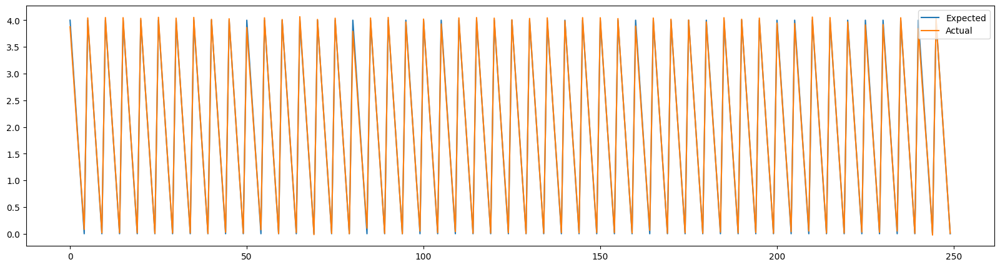

Streaming output truncated to the last 5000 lines.
  [0.07344401]]

 [[3.8876357 ]
  [2.6296449 ]
  [1.8363299 ]
  [1.0096278 ]
  [0.2355631 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.8594103 ]
  [2.8178458 ]
  [1.8847182 ]
  [0.9800362 ]
  [0.03151172]]

 [[3.8125885 ]
  [2.7975073 ]
  [1.8772651 ]
  [0.9651854 ]
  [0.04759157]]

 [[3.8287914 ]
  [2.7973769 ]
  [1.8734045 ]
  [0.95093936]
  [0.03782648]]

 ...

 [[3.8220503 ]
  [2.803203  ]
  [1.881112  ]
  [0.9703874 ]
  [0.04251909]]

 [[3.7572505 ]
  [2.7505157 ]
  [1.7660724 ]
  [0.94490063]
  [0.07312703]]

 [[3.887278  ]
  [2.629317  ]
  [1.8362572 ]
  [1.0096955 ]
  [0.23590428]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.8589215 ]
  [2.8175774 ]
  [1.8846133 ]
  [0.9800803 ]
  [0.03172338]]

 [[3.8121436 ]
  [2.7972782 ]
  [1.8771739 ]
  [0.96522105]
  [0.04779315]]

 [[3.82835   ]
  [2.797066  ]
  [1.8731973 ]
  [0.9508963 ]
  [0.03804189]]

 ...

 [[3.821

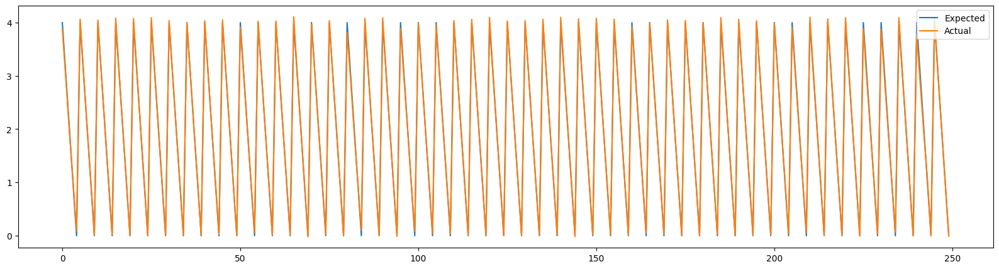

Streaming output truncated to the last 5000 lines.
  [0.10340816]]

 [[3.7931993 ]
  [2.5713034 ]
  [1.8106678 ]
  [1.0219705 ]
  [0.2851457 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.7575057 ]
  [2.7629466 ]
  [1.8620224 ]
  [0.98755836]
  [0.07571548]]

 [[3.721522  ]
  [2.7523005 ]
  [1.8580711 ]
  [0.97446114]
  [0.09047592]]

 [[3.7870884 ]
  [2.667934  ]
  [1.7984617 ]
  [0.97476673]
  [0.20959872]]

 ...

 [[3.7273645 ]
  [2.7279491 ]
  [1.829973  ]
  [0.9685233 ]
  [0.10776848]]

 [[3.6812935 ]
  [2.7083902 ]
  [1.7492776 ]
  [0.946126  ]
  [0.10394108]]

 [[3.792678  ]
  [2.571023  ]
  [1.8105304 ]
  [1.0220351 ]
  [0.28536522]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.7569685 ]
  [2.762652  ]
  [1.8618877 ]
  [0.98758537]
  [0.0759632 ]]

 [[3.721009  ]
  [2.752046  ]
  [1.8579645 ]
  [0.9744934 ]
  [0.09070045]]

 [[3.7869263 ]
  [2.6672144 ]
  [1.7986677 ]
  [0.97510266]
  [0.21082842]]

 ...

 [[3.726

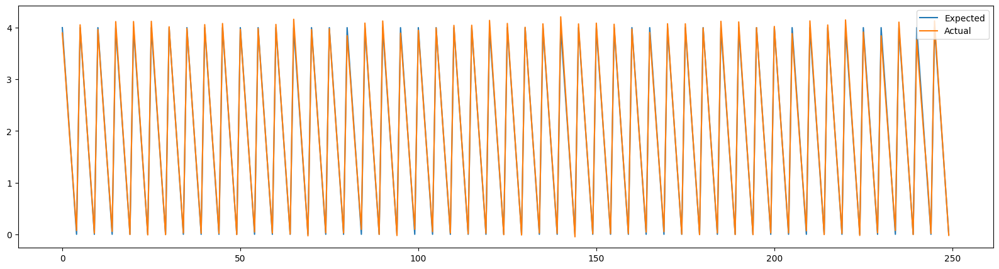

Streaming output truncated to the last 5000 lines.
  [0.11119431]]

 [[3.687911  ]
  [2.5188546 ]
  [1.7837813 ]
  [1.0348992 ]
  [0.32787335]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.64755   ]
  [2.6667085 ]
  [1.8004181 ]
  [0.99130714]
  [0.1859498 ]]

 [[3.6241472 ]
  [2.704696  ]
  [1.8351835 ]
  [0.98281944]
  [0.13531822]]

 [[3.6853397 ]
  [2.5897267 ]
  [1.8100808 ]
  [1.0120468 ]
  [0.3250454 ]]

 ...

 [[3.6485212 ]
  [2.5974884 ]
  [1.7964447 ]
  [1.0166407 ]
  [0.3178581 ]]

 [[3.551111  ]
  [2.6470551 ]
  [1.7429886 ]
  [0.9515297 ]
  [0.11142212]]

 [[3.6873794 ]
  [2.518534  ]
  [1.7836689 ]
  [1.0349379 ]
  [0.32805097]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.6470048 ]
  [2.6659608 ]
  [1.7999649 ]
  [0.99149096]
  [0.1871556 ]]

 [[3.623674  ]
  [2.704473  ]
  [1.835061  ]
  [0.9828706 ]
  [0.13555098]]

 [[3.6847205 ]
  [2.589418  ]
  [1.8100401 ]
  [1.0121659 ]
  [0.32537884]]

 ...

 [[3.648

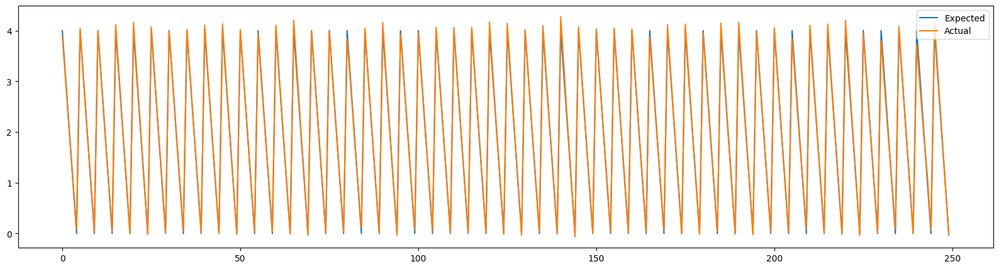

Streaming output truncated to the last 5000 lines.
  [0.16586679]]

 [[3.5760746 ]
  [2.468243  ]
  [1.7591562 ]
  [1.0492498 ]
  [0.37129217]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.5582922 ]
  [2.587779  ]
  [1.767134  ]
  [1.0153377 ]
  [0.30443388]]

 [[3.5432456 ]
  [2.6177924 ]
  [1.7583542 ]
  [0.9878736 ]
  [0.22429353]]

 [[3.5883605 ]
  [2.5440102 ]
  [1.7961779 ]
  [1.0283135 ]
  [0.37423253]]

 ...

 [[3.5541725 ]
  [2.544948  ]
  [1.7912297 ]
  [1.0382934 ]
  [0.38048166]]

 [[3.4308553 ]
  [2.5957546 ]
  [1.7079686 ]
  [0.95508224]
  [0.16605717]]

 [[3.5755014 ]
  [2.4679644 ]
  [1.7590568 ]
  [1.0493191 ]
  [0.3714884 ]]], shape=(466, 5, 1), dtype=float32)
(466, 5, 25)
Predictions tf.Tensor(
[[[3.5579228 ]
  [2.5875568 ]
  [1.7670896 ]
  [1.0153993 ]
  [0.30467725]]

 [[3.5428374 ]
  [2.617104  ]
  [1.7577419 ]
  [0.9880556 ]
  [0.22530735]]

 [[3.5879395 ]
  [2.5437553 ]
  [1.7960694 ]
  [1.0283473 ]
  [0.37444282]]

 ...

 [[3.553

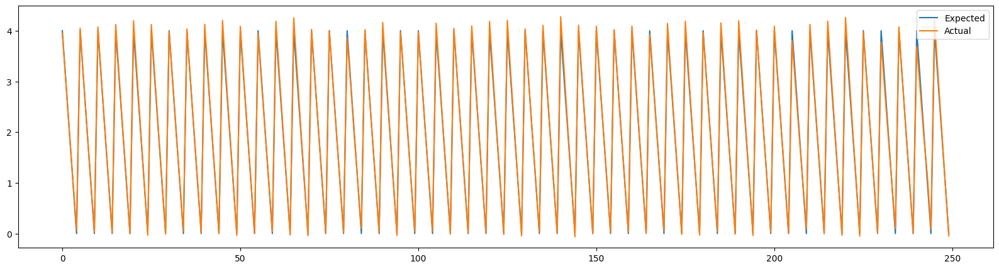

(466, 5, 1)


In [ ]:
advX = []
attack_prediction = []
rmse_attack = []
for i in range(len(epsilon)):
  advX.append(bim_attack(saved_model, epsilon[i], X_test, Y_test, 0.01))
  attack_prediction.append(model(advX[i],training=False))
  # plot(test_y, attack_prediction[i])
  fig = plt.figure()
  expected = np.concatenate(Y_test[0: 50]).ravel()
  actual = np.concatenate(attack_prediction[i][0: 50]).ravel()
  xc  = range(len(expected))
  plt.plot(xc, expected, label='Expected')
  plt.plot(xc, actual, label='Actual')
  fig.set_size_inches(20, 5)
  plt.legend()
  plt.show()
  rmse_attack.append(rmse_metric(Y_test, attack_prediction[i]))

In [ ]:
rmse_attack

[0.040419575, 0.047605135, 0.056658797, 0.06764695, 0.08228478]

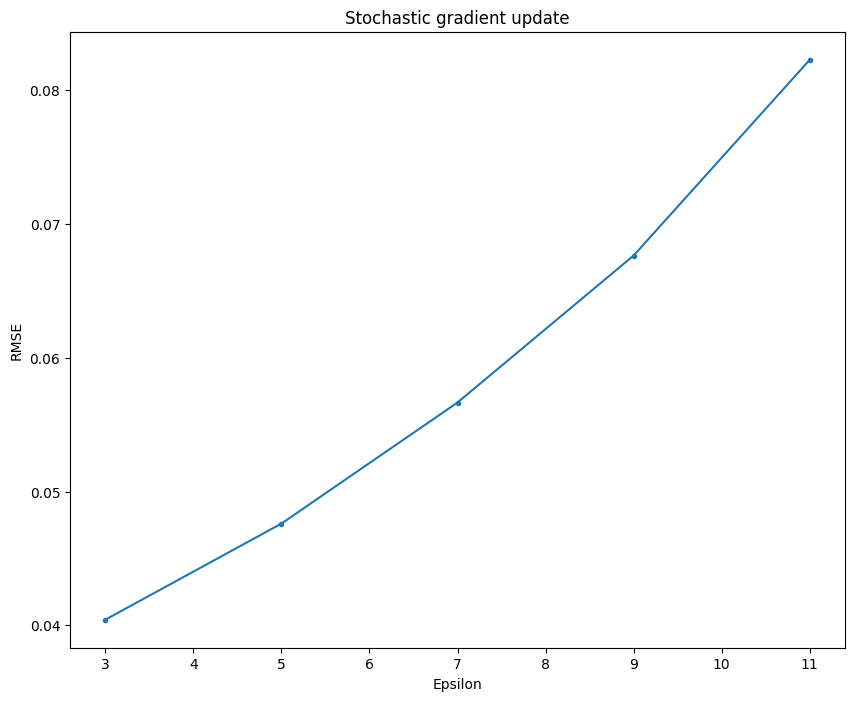

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.ylabel('RMSE')
plt.xlabel('Epsilon')
plt.title("Stochastic gradient update")
plt.plot(epsilon, rmse_attack, marker=".")
plt.show()